## Import Libraries

In [1]:
# import libs

import numpy as np
import numpy.random as nr
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import networkx as nx

import random
import copy
import time
import itertools

from vcopt import vcopt

# Graph-based VRP

In [6]:
# init parameters

NO_TOWNS = 50 # number of towns (town numbering is from [0, NO_TOWNS-1])
STARTING_TOWN = 0 # set starting town
nr.seed(69) # set fixed seed for rng

NO_POOL = 40
NO_SALESMAN = 3

In [7]:
# function for creating town coordinates
def create_towns(NO_TOWNS):
    """generate random x and y coordinates for each town"""

    towns_x = nr.rand(NO_TOWNS) # x coordinates for NO_TOWNS number of towns
    towns_y = nr.rand(NO_TOWNS) # y coordinates for NO_TOWNS number of towns
    
    return towns_x, towns_y


towns_x, towns_y = create_towns(NO_TOWNS) # generate coordinates for each town

start_town_x = towns_x[STARTING_TOWN]
start_town_y = towns_y[STARTING_TOWN]

path = np.arange(NO_TOWNS) # generate a random initial path that passes through all towns 

for i in range(NO_SALESMAN-2):
    path = np.append(path, STARTING_TOWN)

In [8]:
path

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49,  0])

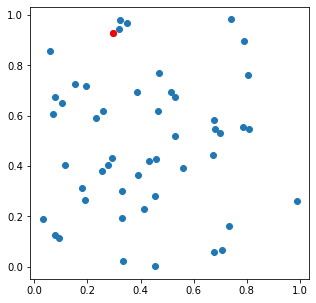

In [9]:
plt.figure(figsize=(5, 5))
plt.scatter(towns_x, towns_y)
plt.scatter(start_town_x, start_town_y, c='red')

In [10]:
# create scoring function for current path

def score_func(path):

    costs = []

    current_index = 0
    
    if NO_SALESMAN == 1:
        
        # 1) add costs between each non-starting town according to path
        cost = sum(((towns_y[path][1:] - towns_y[path][:-1])**2 + (towns_x[path][1:] - towns_x[path][:-1])**2)**0.5)

        # 2) add cost between first non-starting town and start town
        cost += ((towns_x[path][0] - start_town_x)**2 + (towns_y[path][0] - start_town_y)**2)**0.5 

        # 3) add cost between last non-starting town and start town
        cost += ((towns_x[path][-1] - start_town_x)**2 + (towns_y[path][-1] - start_town_y)**2)**0.5
        
        return cost

    for i in range(NO_SALESMAN):

        if i == 0:    
            next_index = np.where(path==STARTING_TOWN)[0][i]
            para = path[current_index:next_index+1][::-1]
            current_index = next_index

        elif i != NO_SALESMAN - 1:
            next_index = np.where(path==STARTING_TOWN)[0][i]
            para = path[current_index:next_index]
            current_index = next_index

        else: 
            para = path[current_index:]

        # 1) add costs between each non-starting town according to path
        cost = sum(((towns_y[para][1:] - towns_y[para][:-1])**2 + (towns_x[para][1:] - towns_x[para][:-1])**2)**0.5)
#         print(cost)
#         print(para)
        # 2) add cost between last non-starting town and start town
        cost += ((towns_x[para][-1] - start_town_x)**2 + (towns_y[para][-1] - start_town_y)**2)**0.5
#         print(para)
#         print(cost)
        costs.append(cost)

    return max(costs)


In [11]:
# def plotting function for visualising paths at every step of optimisation


def tsp_show_pool(pool, **info):
    """function for visualising path at each generation"""
    
    global history_vcopt
    
    # access the info dictionary provided by tspGA() function to get metrics
    
    print(info)
    
    gen = info['gen']
    best_index = info['best_index']
    best_score = info['best_score']
    mean_score = info['mean_score']
    mean_gap = info['mean_gap']
    time = info['time']
    
    history_vcopt.append(mean_score)
    
    plt.figure(figsize=(6, 6))
    
    # visualise some of the paths in each generation's population
    for para in pool[:10]:
        plt.plot(towns_x[para], towns_y[para], 'ok-', alpha=0.01)
    
    best_path_of_pool = np.concatenate(([STARTING_TOWN], pool[best_index], [STARTING_TOWN]))
    plt.plot(towns_x[best_path_of_pool], towns_y[best_path_of_pool], 'or-', linewidth=1.5)
    plt.plot(towns_x[STARTING_TOWN], towns_y[STARTING_TOWN], 'or', markerfacecolor='w') #indicate start position with X

    plt.tick_params(     
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        left=False,
        labelbottom=False,
        labelleft=False) # labels along the bottom edge are off
    
    for i, xy in enumerate(zip(towns_x, towns_y), 0):
        plt.text(xy[0]+0.01, xy[1]+0.01, s=i)
        
    plt.xlim([-0.05, 1.05]); plt.ylim([-0.05, 1.05])
    plt.title("(20 Waypoints, 4 Robots)\ngen={}, best={:.3f} mean={:.3f} time={:.3f}".format(gen, best_score, mean_score, time))

    # saving the images
    plt.savefig(f'training_images/{gen}', facecolor='white', transparent=False)
    plt.show()
    

[ 2  8 41 13 31 26 42 25 48  5 19 36 46 16 38 11 27 23 43 49 37 32 24  3
 21 18 45 14 15 39  6 40  1 33 47  7 10 30  0 44 29 20 12 22  9 28 34 35
  4 17  0]
________________________________________ info ________________________________________
para_range     : n=51
score_func     : <class 'function'>
aim            : ==0.0
show_pool_func : '<function tsp_show_pool at 0x000001E74CA245E0>'
seed           : 69
pool_num       : 40
max_gen        : None
core_num       : 1 (*vcopt, vc-grendel)
_______________________________________ start ________________________________________
Scoring first gen 40/40        
Mini 2-opting first gen 40/40        
{'gen': 0, 'best_index': 26, 'best_score': 8.424954364837792, 'mean_score': 13.719586274936727, 'mean_gap': 13.719586274936727, 'time': 0.02895331382751465}


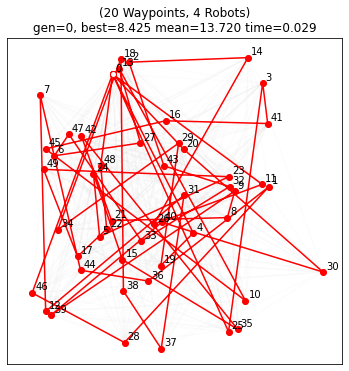

{'gen': 40, 'best_index': 16, 'best_score': 8.228666189906948, 'mean_score': 10.769567580441237, 'mean_gap': 10.769567580441237, 'time': 1.1272430419921875}


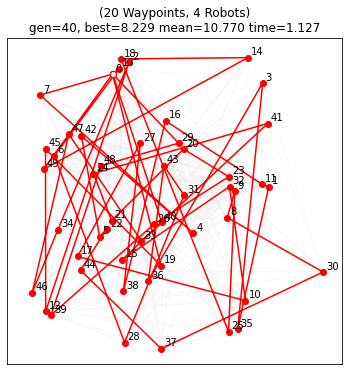

{'gen': 80, 'best_index': 14, 'best_score': 7.722314947734749, 'mean_score': 10.025965755026395, 'mean_gap': 10.025965755026395, 'time': 2.324667453765869}


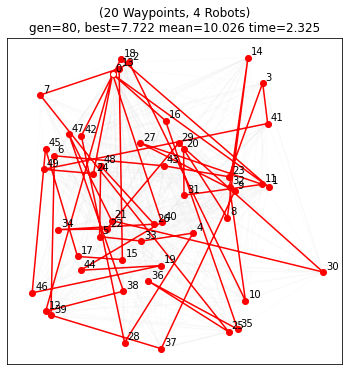

{'gen': 120, 'best_index': 7, 'best_score': 7.676134162208845, 'mean_score': 9.263174665887707, 'mean_gap': 9.263174665887707, 'time': 3.4323620796203613}


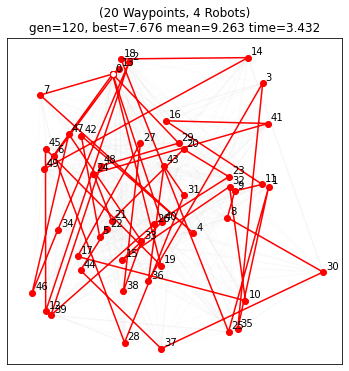

{'gen': 160, 'best_index': 4, 'best_score': 7.348660148803034, 'mean_score': 8.72195135523432, 'mean_gap': 8.72195135523432, 'time': 4.685551881790161}


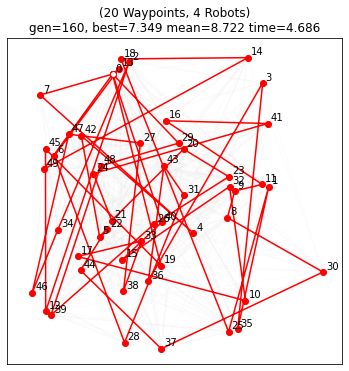

{'gen': 200, 'best_index': 20, 'best_score': 7.170304838492542, 'mean_score': 8.441265778542066, 'mean_gap': 8.441265778542066, 'time': 5.963089227676392}


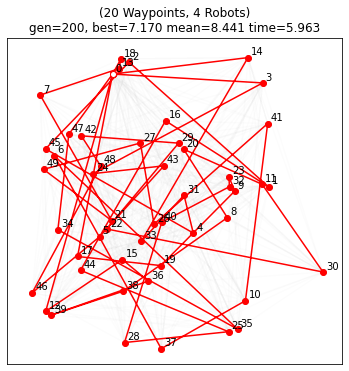

{'gen': 240, 'best_index': 21, 'best_score': 6.952478477869266, 'mean_score': 8.197204933969653, 'mean_gap': 8.197204933969653, 'time': 7.280962944030762}


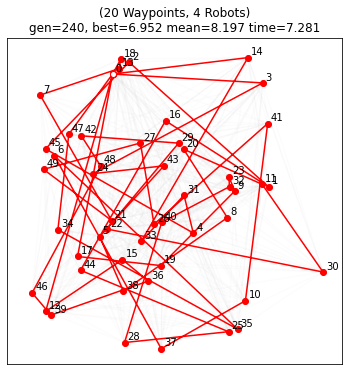

{'gen': 280, 'best_index': 5, 'best_score': 6.924114495381399, 'mean_score': 8.045122371097488, 'mean_gap': 8.045122371097488, 'time': 8.450141429901123}


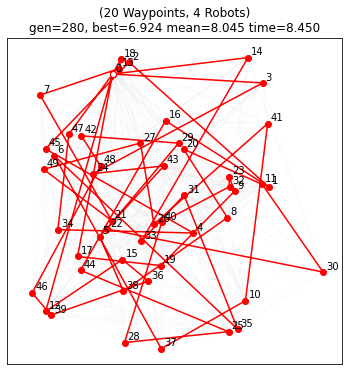

{'gen': 320, 'best_index': 33, 'best_score': 6.720269353178268, 'mean_score': 7.869633720648304, 'mean_gap': 7.869633720648304, 'time': 9.654109001159668}


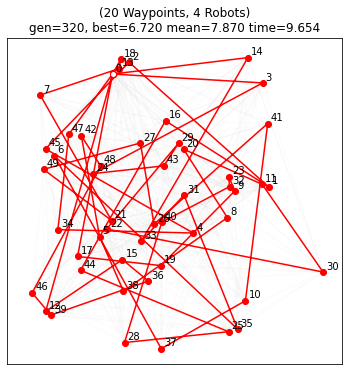

{'gen': 360, 'best_index': 28, 'best_score': 6.598360802547708, 'mean_score': 7.758083385373633, 'mean_gap': 7.758083385373633, 'time': 10.876842498779297}


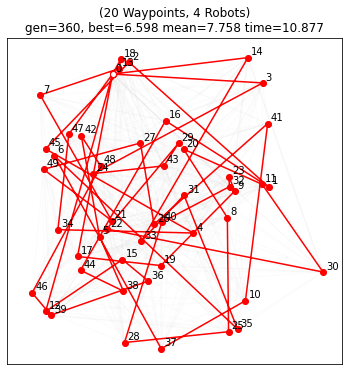

{'gen': 400, 'best_index': 1, 'best_score': 6.577297800064265, 'mean_score': 7.627895162783626, 'mean_gap': 7.627895162783626, 'time': 12.110890865325928}


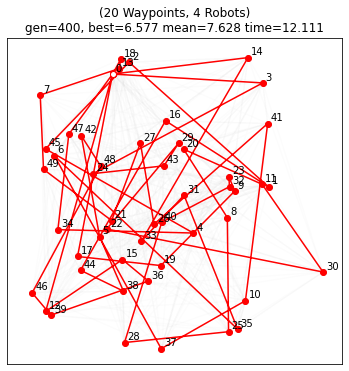

{'gen': 440, 'best_index': 24, 'best_score': 6.3129716315514415, 'mean_score': 7.514695702152823, 'mean_gap': 7.514695702152823, 'time': 13.302144289016724}


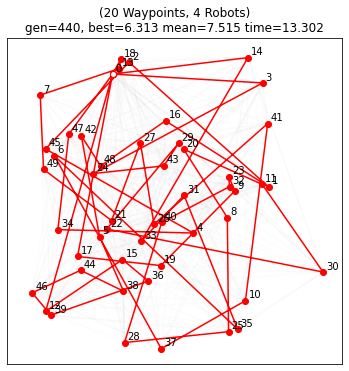

{'gen': 480, 'best_index': 8, 'best_score': 6.206157780708568, 'mean_score': 7.422376605435015, 'mean_gap': 7.422376605435015, 'time': 14.590994358062744}


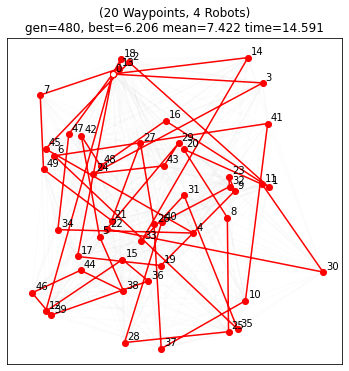

{'gen': 520, 'best_index': 37, 'best_score': 6.1644064711027236, 'mean_score': 7.325146127851269, 'mean_gap': 7.325146127851269, 'time': 15.883471250534058}


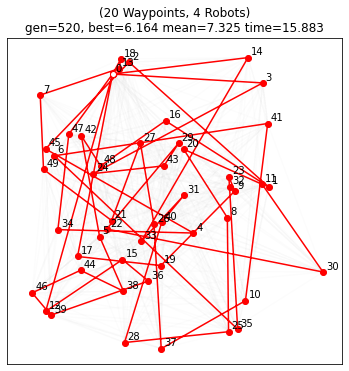

{'gen': 560, 'best_index': 16, 'best_score': 6.100887369770314, 'mean_score': 7.2419306955564995, 'mean_gap': 7.2419306955564995, 'time': 17.120407342910767}


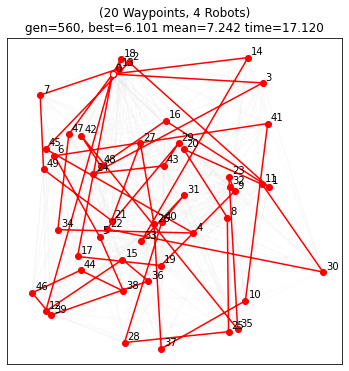

{'gen': 600, 'best_index': 16, 'best_score': 6.0688626531554295, 'mean_score': 7.168823788853777, 'mean_gap': 7.168823788853777, 'time': 18.4586079120636}


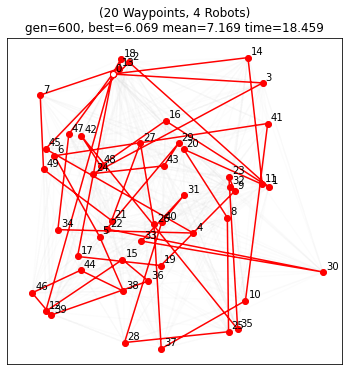

{'gen': 640, 'best_index': 16, 'best_score': 6.039234267438171, 'mean_score': 7.084272883527217, 'mean_gap': 7.084272883527217, 'time': 20.30688214302063}


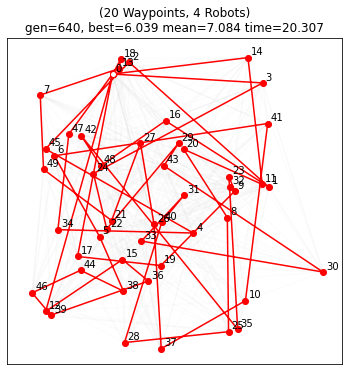

{'gen': 680, 'best_index': 16, 'best_score': 6.036353228054726, 'mean_score': 7.019660906474366, 'mean_gap': 7.019660906474366, 'time': 22.191460847854614}


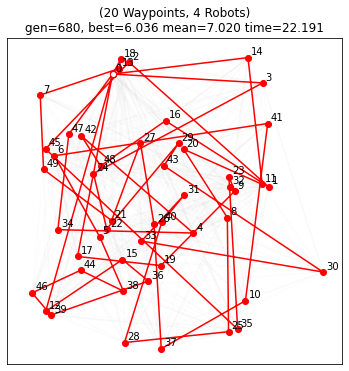

{'gen': 720, 'best_index': 16, 'best_score': 6.016006711857929, 'mean_score': 6.9482870830732395, 'mean_gap': 6.9482870830732395, 'time': 24.07967257499695}


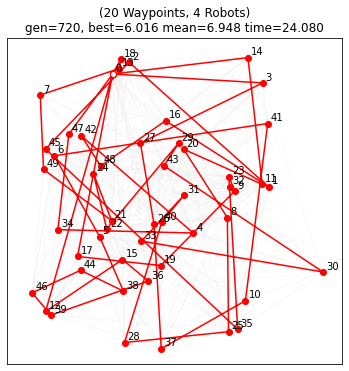

{'gen': 760, 'best_index': 1, 'best_score': 5.880096232868693, 'mean_score': 6.872967765574261, 'mean_gap': 6.872967765574261, 'time': 26.118024587631226}


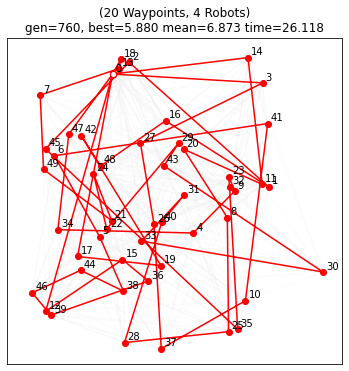

{'gen': 800, 'best_index': 8, 'best_score': 5.875045747905532, 'mean_score': 6.8041846763560985, 'mean_gap': 6.8041846763560985, 'time': 28.1365704536438}


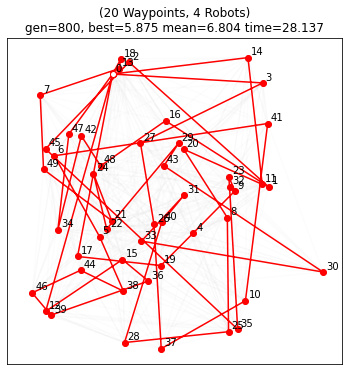

{'gen': 840, 'best_index': 9, 'best_score': 5.803825150692418, 'mean_score': 6.7274151464441045, 'mean_gap': 6.7274151464441045, 'time': 30.182231426239014}


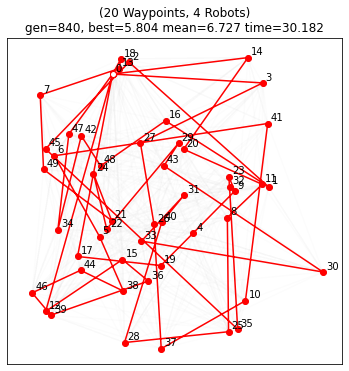

{'gen': 880, 'best_index': 9, 'best_score': 5.707737273812737, 'mean_score': 6.66056492216733, 'mean_gap': 6.66056492216733, 'time': 32.31067609786987}


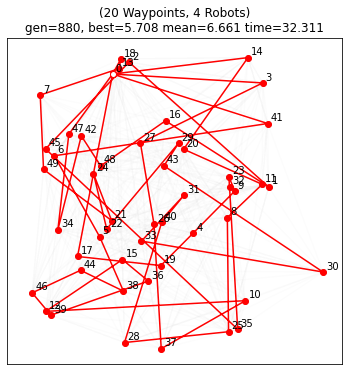

{'gen': 920, 'best_index': 9, 'best_score': 5.707737273812735, 'mean_score': 6.570445592245579, 'mean_gap': 6.570445592245579, 'time': 33.92988395690918}


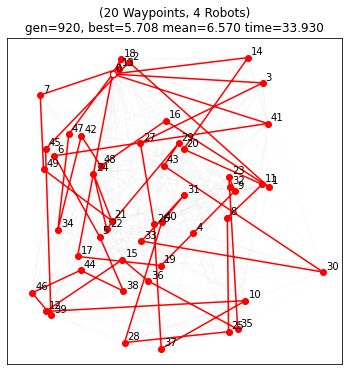

{'gen': 960, 'best_index': 9, 'best_score': 5.653087705697125, 'mean_score': 6.52064987334623, 'mean_gap': 6.52064987334623, 'time': 35.42226314544678}


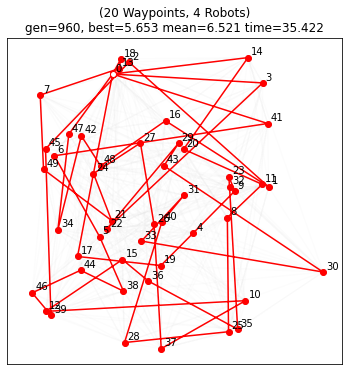

{'gen': 1000, 'best_index': 9, 'best_score': 5.553983884730918, 'mean_score': 6.465483616632143, 'mean_gap': 6.465483616632143, 'time': 36.832377433776855}


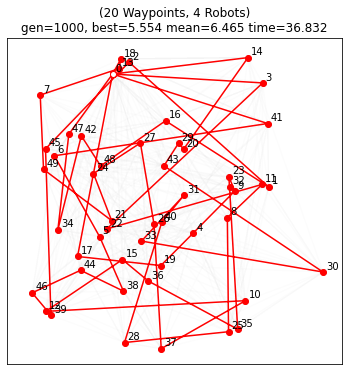

{'gen': 1040, 'best_index': 22, 'best_score': 5.501695566374741, 'mean_score': 6.401233140856627, 'mean_gap': 6.401233140856627, 'time': 38.27253603935242}


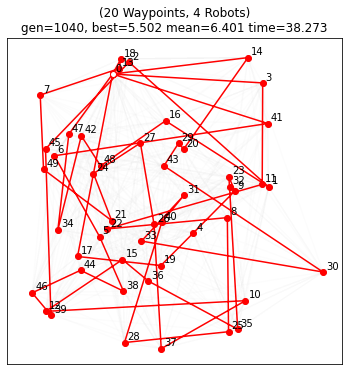

{'gen': 1080, 'best_index': 22, 'best_score': 5.486939384055946, 'mean_score': 6.333732137189296, 'mean_gap': 6.333732137189296, 'time': 39.69718027114868}


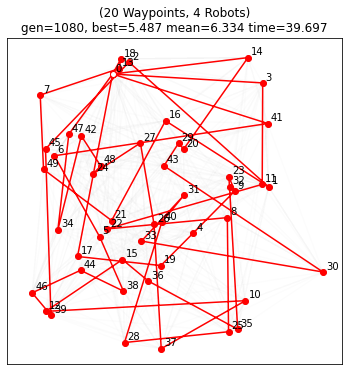

{'gen': 1120, 'best_index': 39, 'best_score': 5.48222897907754, 'mean_score': 6.274140452234255, 'mean_gap': 6.274140452234255, 'time': 40.97124528884888}


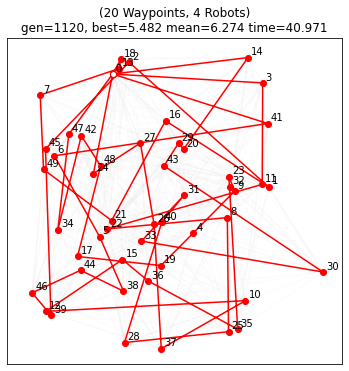

{'gen': 1160, 'best_index': 14, 'best_score': 5.455930640275148, 'mean_score': 6.199202315263612, 'mean_gap': 6.199202315263612, 'time': 42.23360323905945}


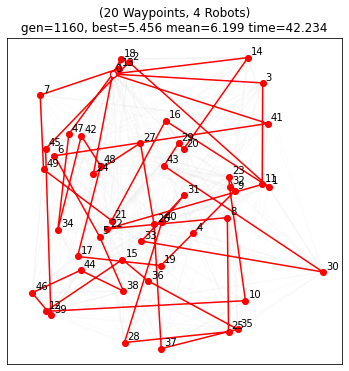

{'gen': 1200, 'best_index': 14, 'best_score': 5.4231794714951045, 'mean_score': 6.139796545902795, 'mean_gap': 6.139796545902795, 'time': 43.54103875160217}


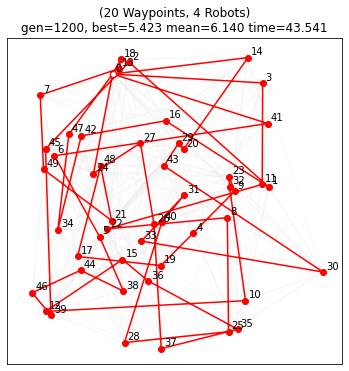

{'gen': 1240, 'best_index': 2, 'best_score': 5.396013184250774, 'mean_score': 6.079495311900899, 'mean_gap': 6.079495311900899, 'time': 44.868884325027466}


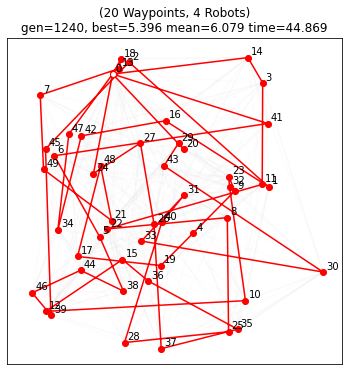

{'gen': 1280, 'best_index': 2, 'best_score': 5.356751260536282, 'mean_score': 6.0157066197447575, 'mean_gap': 6.0157066197447575, 'time': 46.229183197021484}


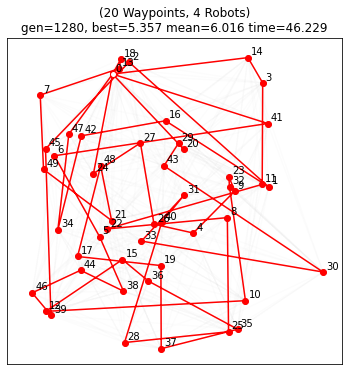

{'gen': 1320, 'best_index': 37, 'best_score': 5.228884300547355, 'mean_score': 5.948231610173134, 'mean_gap': 5.948231610173134, 'time': 47.763357162475586}


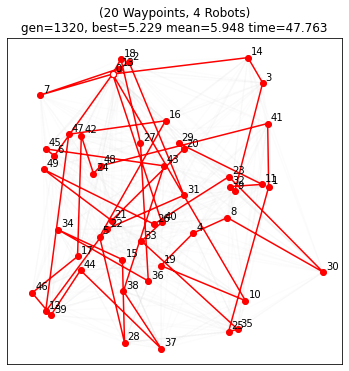

{'gen': 1360, 'best_index': 11, 'best_score': 5.153486526651445, 'mean_score': 5.8891420108724315, 'mean_gap': 5.8891420108724315, 'time': 49.15491008758545}


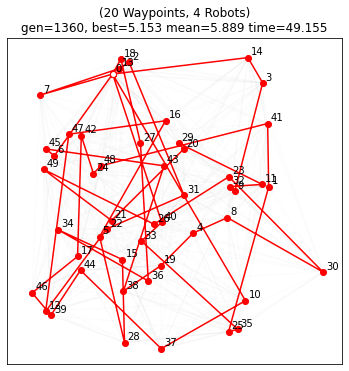

{'gen': 1400, 'best_index': 1, 'best_score': 5.054718415830336, 'mean_score': 5.839982938762091, 'mean_gap': 5.839982938762091, 'time': 50.45397138595581}


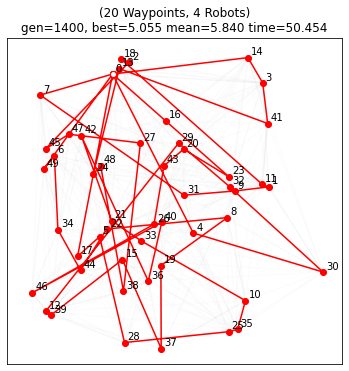

{'gen': 1440, 'best_index': 33, 'best_score': 5.054718415830335, 'mean_score': 5.790388333187191, 'mean_gap': 5.790388333187191, 'time': 51.66293907165527}


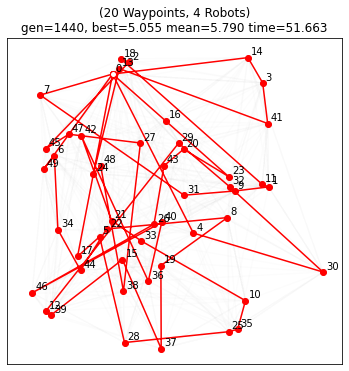

{'gen': 1480, 'best_index': 7, 'best_score': 5.006791440449905, 'mean_score': 5.743206365138884, 'mean_gap': 5.743206365138884, 'time': 52.896021366119385}


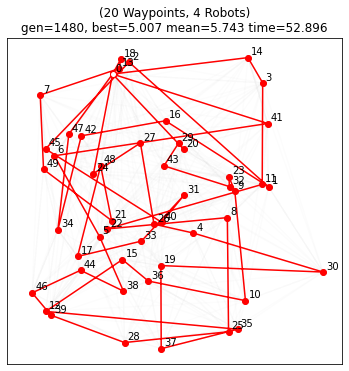

{'gen': 1520, 'best_index': 39, 'best_score': 4.9791232285749905, 'mean_score': 5.694286111110346, 'mean_gap': 5.694286111110346, 'time': 54.15512299537659}


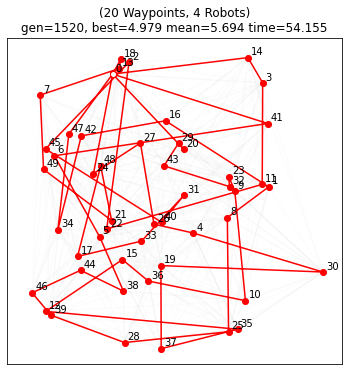

{'gen': 1560, 'best_index': 39, 'best_score': 4.930241272841861, 'mean_score': 5.649418268852541, 'mean_gap': 5.649418268852541, 'time': 55.39450216293335}


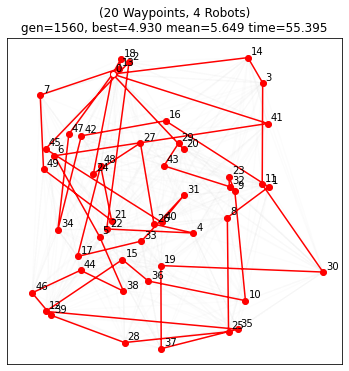

{'gen': 1600, 'best_index': 39, 'best_score': 4.84139804053798, 'mean_score': 5.594760946291606, 'mean_gap': 5.594760946291606, 'time': 56.640700817108154}


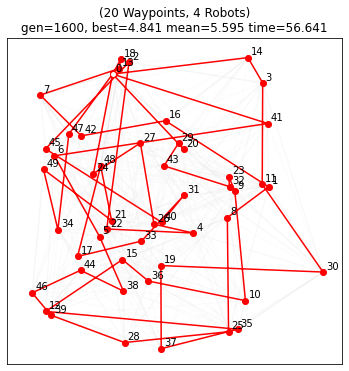

{'gen': 1640, 'best_index': 39, 'best_score': 4.809440560769041, 'mean_score': 5.533475240169848, 'mean_gap': 5.533475240169848, 'time': 57.9664785861969}


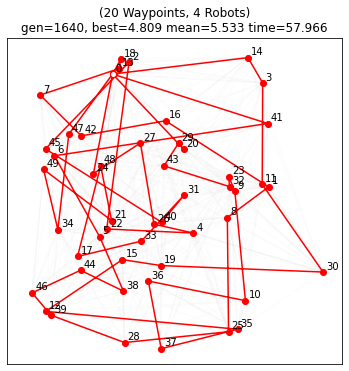

{'gen': 1680, 'best_index': 39, 'best_score': 4.753668433798646, 'mean_score': 5.4829000587628105, 'mean_gap': 5.4829000587628105, 'time': 59.356849193573}


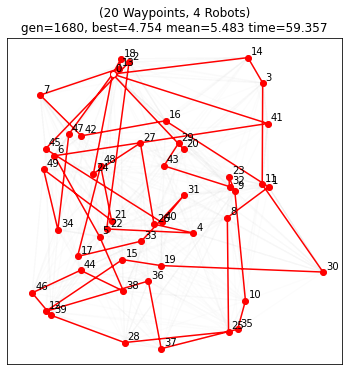

{'gen': 1720, 'best_index': 23, 'best_score': 4.661423481544582, 'mean_score': 5.433225063960996, 'mean_gap': 5.433225063960996, 'time': 60.627599239349365}


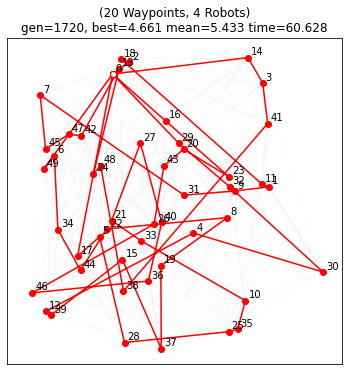

{'gen': 1760, 'best_index': 24, 'best_score': 4.624061373574615, 'mean_score': 5.378586331428038, 'mean_gap': 5.378586331428038, 'time': 61.9194712638855}


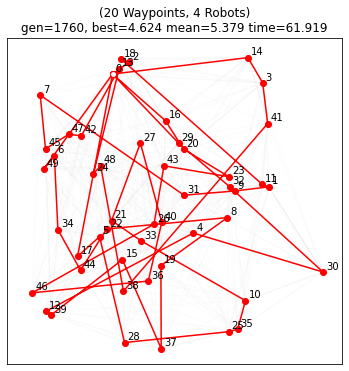

{'gen': 1800, 'best_index': 13, 'best_score': 4.602052898687526, 'mean_score': 5.335603083898169, 'mean_gap': 5.335603083898169, 'time': 63.16845941543579}


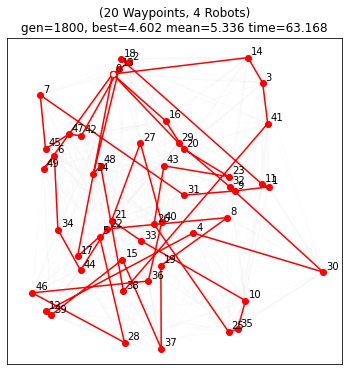

{'gen': 1840, 'best_index': 24, 'best_score': 4.579491022884412, 'mean_score': 5.305771794994686, 'mean_gap': 5.305771794994686, 'time': 64.47653865814209}


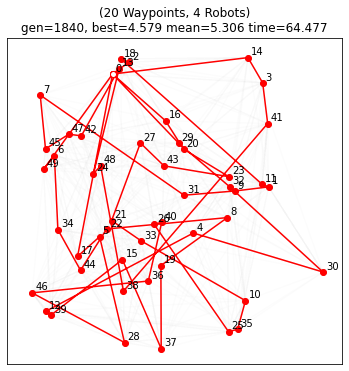

{'gen': 1880, 'best_index': 13, 'best_score': 4.471075550016031, 'mean_score': 5.258977844890372, 'mean_gap': 5.258977844890372, 'time': 65.77087998390198}


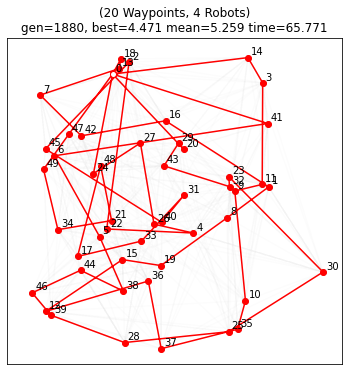

{'gen': 1920, 'best_index': 19, 'best_score': 4.418399176871351, 'mean_score': 5.220986395630606, 'mean_gap': 5.220986395630606, 'time': 67.07948899269104}


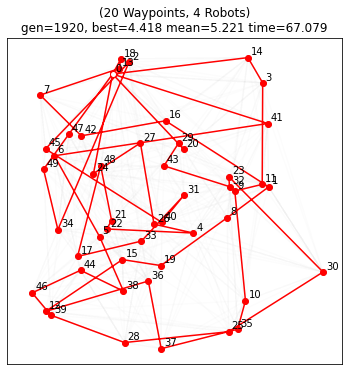

{'gen': 1960, 'best_index': 19, 'best_score': 4.36851689761828, 'mean_score': 5.176745772702622, 'mean_gap': 5.176745772702622, 'time': 68.4691014289856}


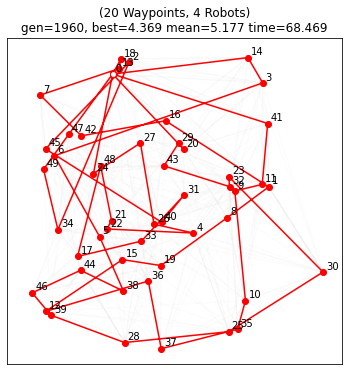

{'gen': 2000, 'best_index': 16, 'best_score': 4.341922673013395, 'mean_score': 5.144659346948723, 'mean_gap': 5.144659346948723, 'time': 69.85866522789001}


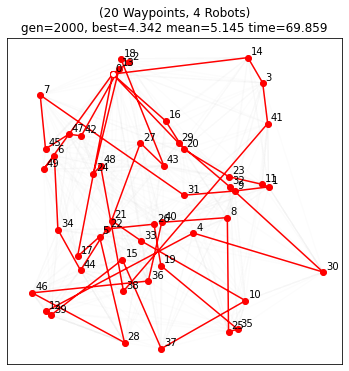

{'gen': 2040, 'best_index': 16, 'best_score': 4.316796640757433, 'mean_score': 5.099115648916461, 'mean_gap': 5.099115648916461, 'time': 71.34410738945007}


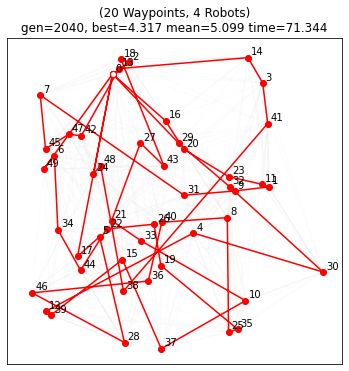

{'gen': 2080, 'best_index': 19, 'best_score': 4.292886825874371, 'mean_score': 5.066629379898793, 'mean_gap': 5.066629379898793, 'time': 72.6323390007019}


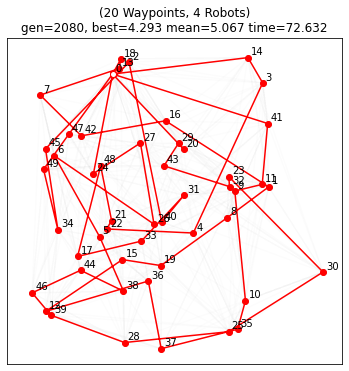

{'gen': 2120, 'best_index': 0, 'best_score': 4.247785783989539, 'mean_score': 5.004841358178116, 'mean_gap': 5.004841358178116, 'time': 73.93263864517212}


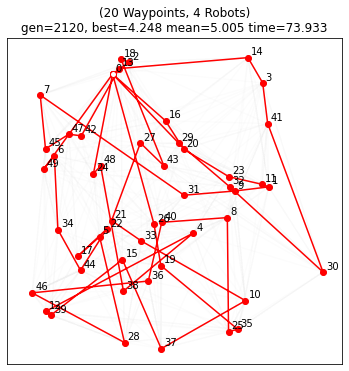

{'gen': 2160, 'best_index': 0, 'best_score': 4.2190608092253585, 'mean_score': 4.956393538078587, 'mean_gap': 4.956393538078587, 'time': 75.26066136360168}


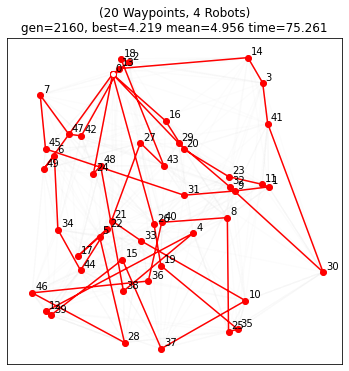

{'gen': 2200, 'best_index': 35, 'best_score': 4.18120322927795, 'mean_score': 4.908022657444404, 'mean_gap': 4.908022657444404, 'time': 76.51208543777466}


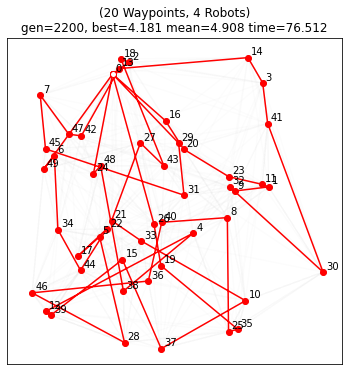

{'gen': 2240, 'best_index': 18, 'best_score': 4.028358465797932, 'mean_score': 4.865774555869047, 'mean_gap': 4.865774555869047, 'time': 77.929354429245}


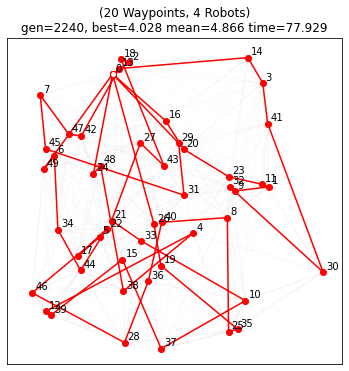

{'gen': 2280, 'best_index': 10, 'best_score': 4.023532279390272, 'mean_score': 4.841362387185415, 'mean_gap': 4.841362387185415, 'time': 79.3513069152832}


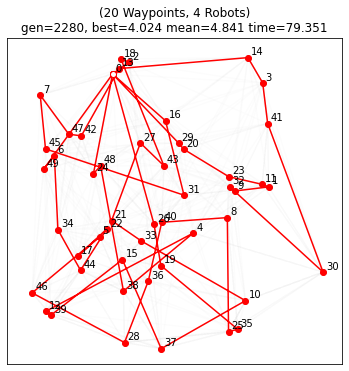

{'gen': 2320, 'best_index': 34, 'best_score': 4.0158715186511404, 'mean_score': 4.80167054479354, 'mean_gap': 4.80167054479354, 'time': 80.68554615974426}


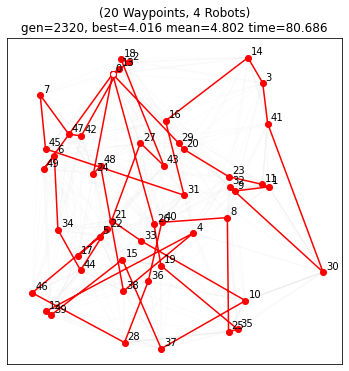

{'gen': 2360, 'best_index': 34, 'best_score': 3.9444126361857137, 'mean_score': 4.76160529157891, 'mean_gap': 4.76160529157891, 'time': 81.95381712913513}


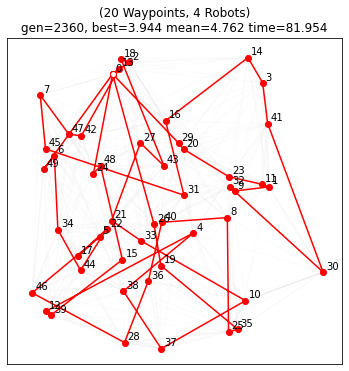

{'gen': 2400, 'best_index': 34, 'best_score': 3.8003894680177237, 'mean_score': 4.704290502995493, 'mean_gap': 4.704290502995493, 'time': 83.38954496383667}


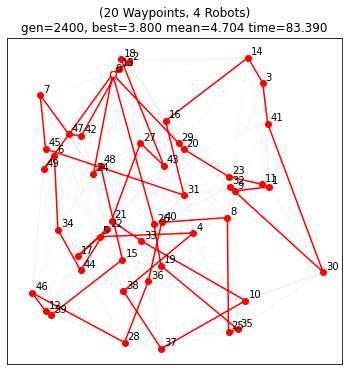

{'gen': 2440, 'best_index': 25, 'best_score': 3.7368500912053295, 'mean_score': 4.667776574935052, 'mean_gap': 4.667776574935052, 'time': 84.82983994483948}


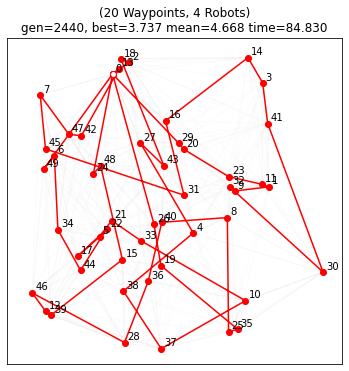

{'gen': 2480, 'best_index': 25, 'best_score': 3.6310964742192366, 'mean_score': 4.63435672134205, 'mean_gap': 4.63435672134205, 'time': 86.12070918083191}


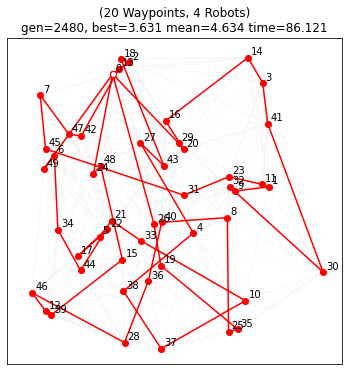

{'gen': 2520, 'best_index': 25, 'best_score': 3.576170123767707, 'mean_score': 4.588721532459563, 'mean_gap': 4.588721532459563, 'time': 87.41673493385315}


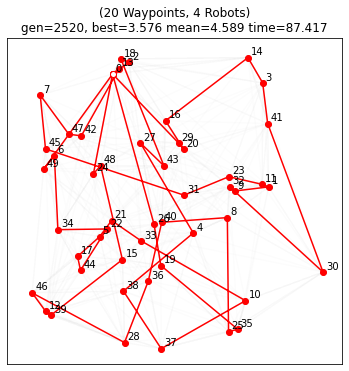

{'gen': 2560, 'best_index': 25, 'best_score': 3.5699601125326414, 'mean_score': 4.540046444037927, 'mean_gap': 4.540046444037927, 'time': 88.73328924179077}


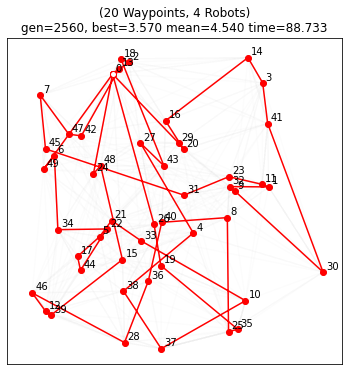

{'gen': 2600, 'best_index': 25, 'best_score': 3.549814189797909, 'mean_score': 4.49626966245772, 'mean_gap': 4.49626966245772, 'time': 90.13051080703735}


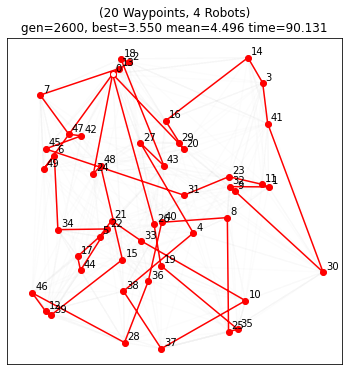

{'gen': 2640, 'best_index': 25, 'best_score': 3.5288019677284233, 'mean_score': 4.458381448220019, 'mean_gap': 4.458381448220019, 'time': 91.51785516738892}


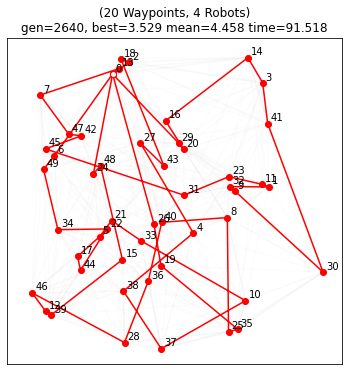

{'gen': 2680, 'best_index': 17, 'best_score': 3.499589235777707, 'mean_score': 4.415171261005909, 'mean_gap': 4.415171261005909, 'time': 92.76146650314331}


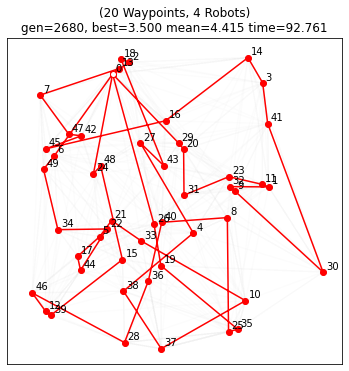

{'gen': 2720, 'best_index': 17, 'best_score': 3.495631736170973, 'mean_score': 4.366700896517902, 'mean_gap': 4.366700896517902, 'time': 94.16495490074158}


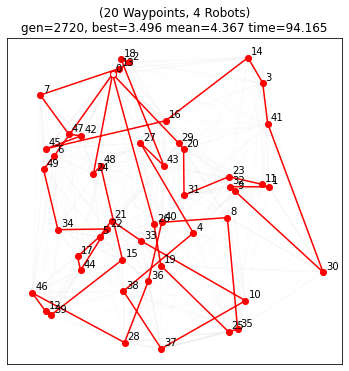

{'gen': 2760, 'best_index': 17, 'best_score': 3.476383023625055, 'mean_score': 4.327918995128146, 'mean_gap': 4.327918995128146, 'time': 95.56335282325745}


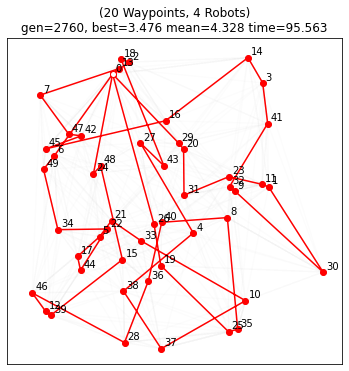

{'gen': 2800, 'best_index': 17, 'best_score': 3.451225677494911, 'mean_score': 4.295256499439768, 'mean_gap': 4.295256499439768, 'time': 96.87886571884155}


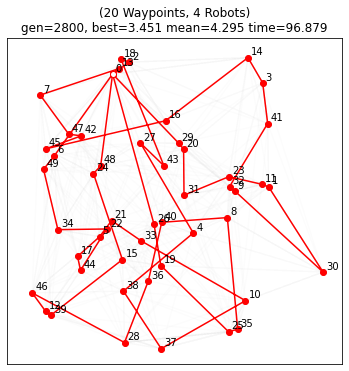

{'gen': 2840, 'best_index': 3, 'best_score': 3.42841244330718, 'mean_score': 4.255619688140118, 'mean_gap': 4.255619688140118, 'time': 98.19163918495178}


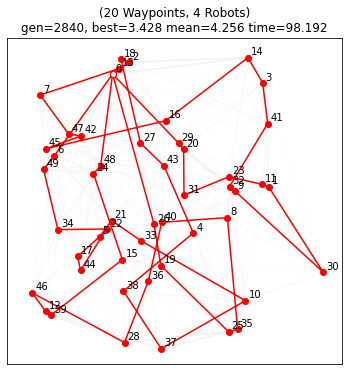

{'gen': 2880, 'best_index': 3, 'best_score': 3.419294619331762, 'mean_score': 4.2224476807707365, 'mean_gap': 4.2224476807707365, 'time': 99.48717164993286}


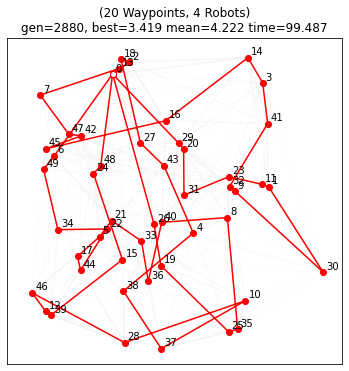

{'gen': 2920, 'best_index': 30, 'best_score': 3.414399834843056, 'mean_score': 4.18585609940409, 'mean_gap': 4.18585609940409, 'time': 100.85710954666138}


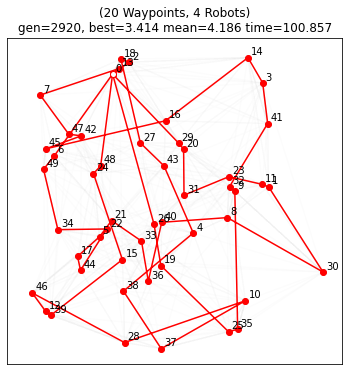

{'gen': 2960, 'best_index': 30, 'best_score': 3.3656511455410527, 'mean_score': 4.142519409130633, 'mean_gap': 4.142519409130633, 'time': 102.32922291755676}


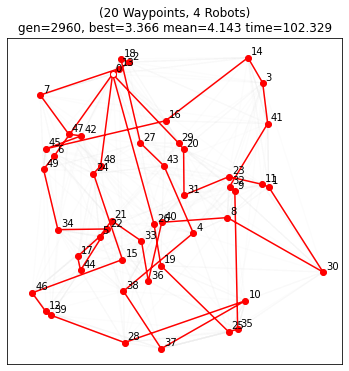

{'gen': 3000, 'best_index': 0, 'best_score': 3.3618430103594843, 'mean_score': 4.108002051622057, 'mean_gap': 4.108002051622057, 'time': 103.73515772819519}


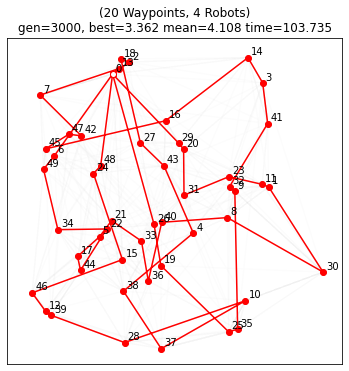

{'gen': 3040, 'best_index': 0, 'best_score': 3.3614375791611915, 'mean_score': 4.07778665895625, 'mean_gap': 4.07778665895625, 'time': 105.14928650856018}


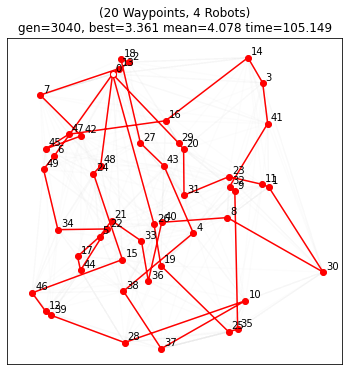

{'gen': 3080, 'best_index': 27, 'best_score': 3.3614375791611906, 'mean_score': 4.053347431483286, 'mean_gap': 4.053347431483286, 'time': 106.54258894920349}


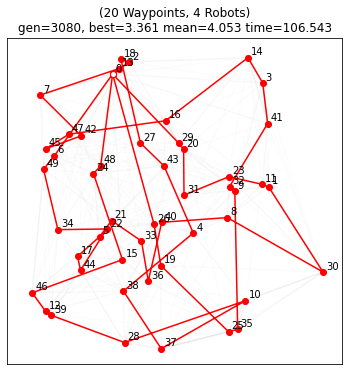

{'gen': 3120, 'best_index': 20, 'best_score': 3.3430599415876836, 'mean_score': 4.017232764204669, 'mean_gap': 4.017232764204669, 'time': 108.21931457519531}


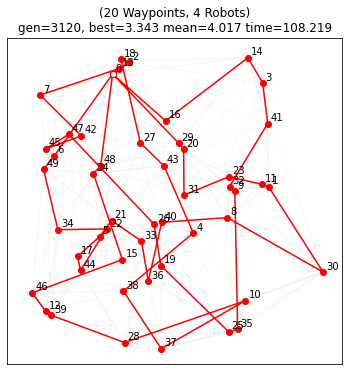

{'gen': 3160, 'best_index': 30, 'best_score': 3.343059941587683, 'mean_score': 3.989808175183299, 'mean_gap': 3.989808175183299, 'time': 109.71702909469604}


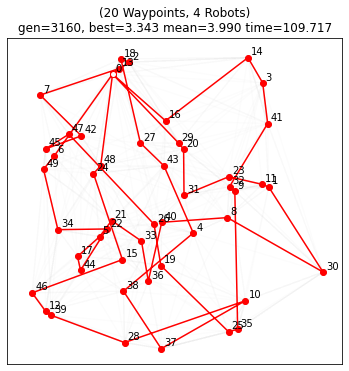

{'gen': 3200, 'best_index': 31, 'best_score': 3.3132517572455793, 'mean_score': 3.9561029260193847, 'mean_gap': 3.9561029260193847, 'time': 111.18106007575989}


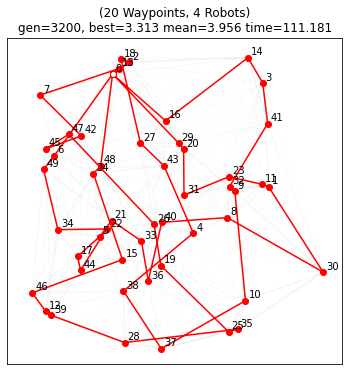

{'gen': 3240, 'best_index': 31, 'best_score': 3.3128882842899374, 'mean_score': 3.926568588927961, 'mean_gap': 3.926568588927961, 'time': 112.60052919387817}


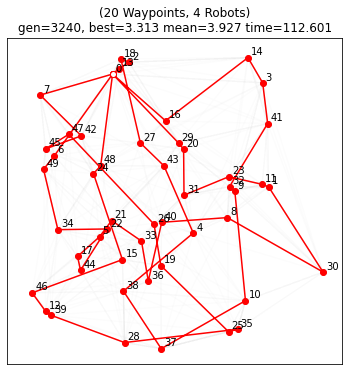

{'gen': 3280, 'best_index': 31, 'best_score': 3.2848860575701098, 'mean_score': 3.9010446761757307, 'mean_gap': 3.9010446761757307, 'time': 114.05052065849304}


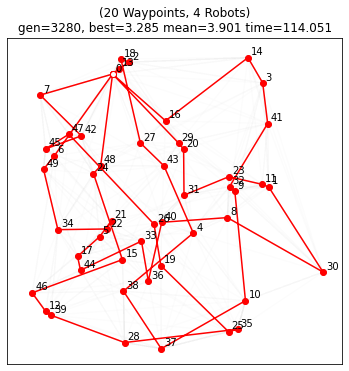

{'gen': 3320, 'best_index': 32, 'best_score': 3.276132958270382, 'mean_score': 3.87349430125298, 'mean_gap': 3.87349430125298, 'time': 115.5258138179779}


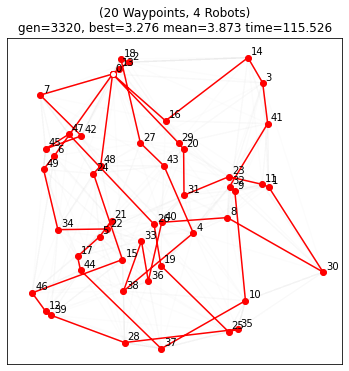

{'gen': 3360, 'best_index': 4, 'best_score': 3.2412692621570924, 'mean_score': 3.8460939988420093, 'mean_gap': 3.8460939988420093, 'time': 117.06684017181396}


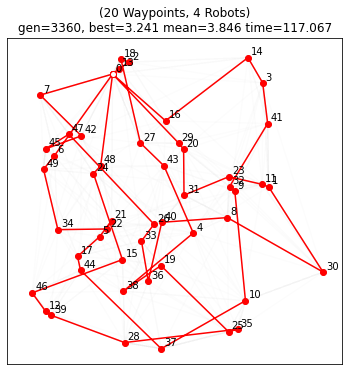

{'gen': 3400, 'best_index': 4, 'best_score': 3.1938732942860804, 'mean_score': 3.817350087204274, 'mean_gap': 3.817350087204274, 'time': 118.75481081008911}


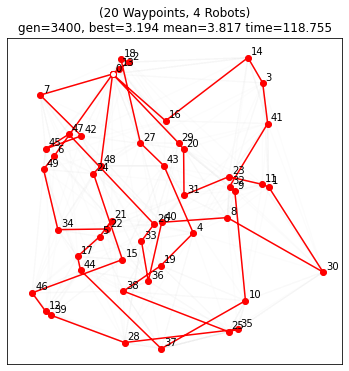

{'gen': 3440, 'best_index': 4, 'best_score': 3.1602070732951564, 'mean_score': 3.786104994677192, 'mean_gap': 3.786104994677192, 'time': 120.3868203163147}


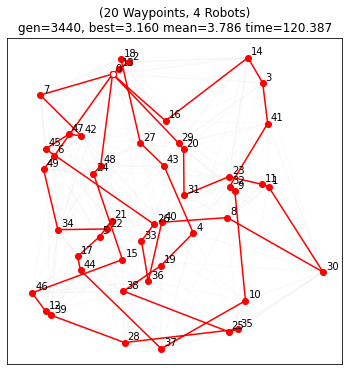

{'gen': 3480, 'best_index': 39, 'best_score': 3.1489325279001665, 'mean_score': 3.762842774356153, 'mean_gap': 3.762842774356153, 'time': 122.20217275619507}


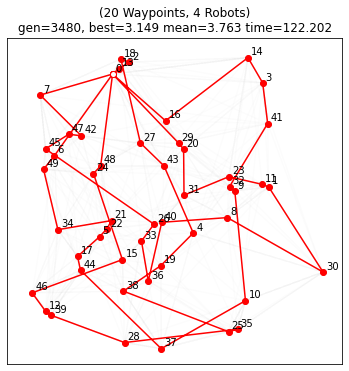

{'gen': 3520, 'best_index': 16, 'best_score': 3.1466750232335334, 'mean_score': 3.741239231456558, 'mean_gap': 3.741239231456558, 'time': 123.79144215583801}


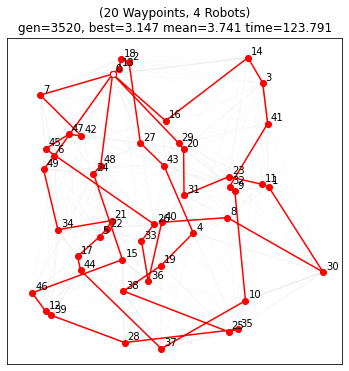

{'gen': 3560, 'best_index': 35, 'best_score': 3.1345532933812996, 'mean_score': 3.7160069994452583, 'mean_gap': 3.7160069994452583, 'time': 125.24607920646667}


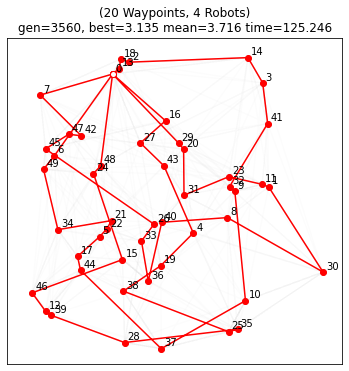

{'gen': 3600, 'best_index': 35, 'best_score': 3.1081021953057246, 'mean_score': 3.6854245321742853, 'mean_gap': 3.6854245321742853, 'time': 126.82256388664246}


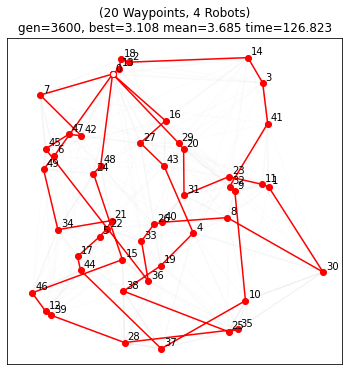

{'gen': 3640, 'best_index': 35, 'best_score': 3.079295803653428, 'mean_score': 3.6636364574024087, 'mean_gap': 3.6636364574024087, 'time': 128.397887468338}


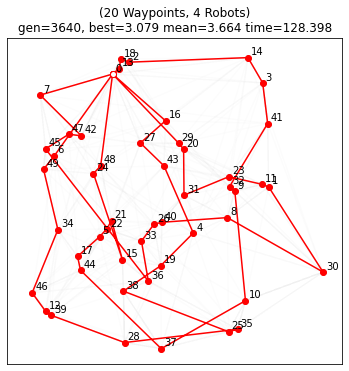

{'gen': 3680, 'best_index': 3, 'best_score': 3.0561689101547955, 'mean_score': 3.6436249175673097, 'mean_gap': 3.6436249175673097, 'time': 130.18335509300232}


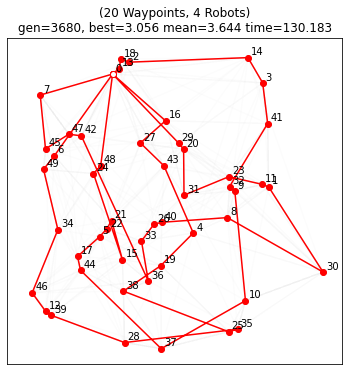

{'gen': 3720, 'best_index': 39, 'best_score': 3.0526820339484164, 'mean_score': 3.6113966281903984, 'mean_gap': 3.6113966281903984, 'time': 132.00114512443542}


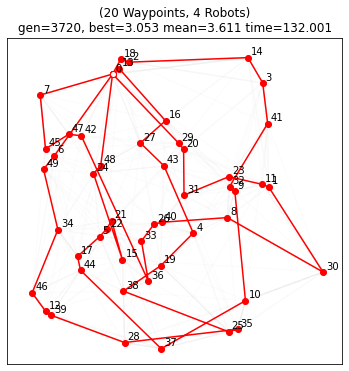

{'gen': 3760, 'best_index': 38, 'best_score': 3.046650561935175, 'mean_score': 3.5838043313617947, 'mean_gap': 3.5838043313617947, 'time': 133.99759030342102}


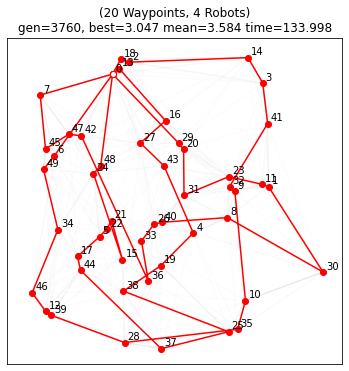

{'gen': 3800, 'best_index': 38, 'best_score': 3.0466505619351745, 'mean_score': 3.557815521009007, 'mean_gap': 3.557815521009007, 'time': 135.8219289779663}


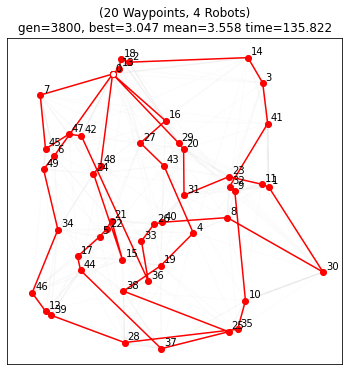

{'gen': 3840, 'best_index': 18, 'best_score': 3.0334558602302093, 'mean_score': 3.527570967207563, 'mean_gap': 3.527570967207563, 'time': 137.55474877357483}


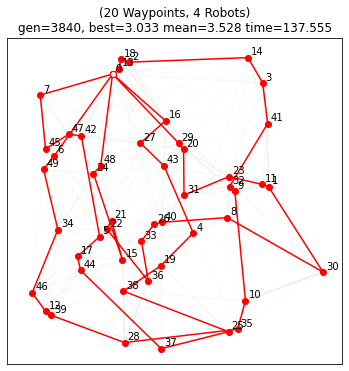

{'gen': 3880, 'best_index': 39, 'best_score': 2.9771279993116098, 'mean_score': 3.4995447609136305, 'mean_gap': 3.4995447609136305, 'time': 139.4020254611969}


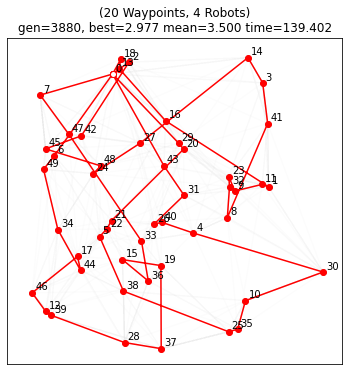

{'gen': 3920, 'best_index': 39, 'best_score': 2.9683374059254404, 'mean_score': 3.4799847386755167, 'mean_gap': 3.4799847386755167, 'time': 141.81259107589722}


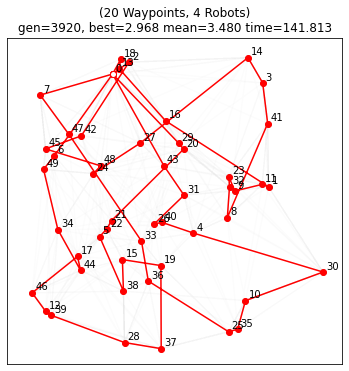

{'gen': 3960, 'best_index': 39, 'best_score': 2.9420895193254677, 'mean_score': 3.4597383661781196, 'mean_gap': 3.4597383661781196, 'time': 144.83820962905884}


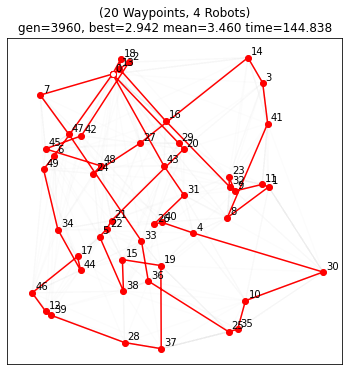

{'gen': 4000, 'best_index': 39, 'best_score': 2.9345613110716395, 'mean_score': 3.444252844136649, 'mean_gap': 3.444252844136649, 'time': 147.66882371902466}


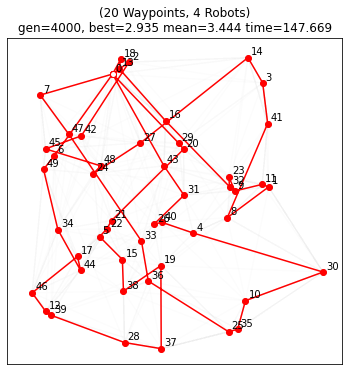

{'gen': 4040, 'best_index': 39, 'best_score': 2.9270956778481985, 'mean_score': 3.4242375550505626, 'mean_gap': 3.4242375550505626, 'time': 150.54829788208008}


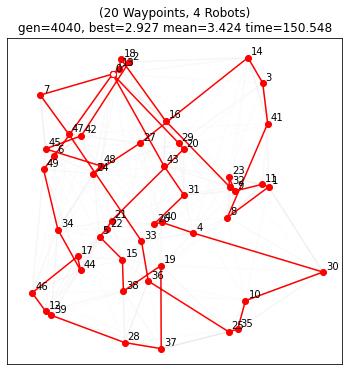

{'gen': 4080, 'best_index': 6, 'best_score': 2.8891575494538664, 'mean_score': 3.3981285921583386, 'mean_gap': 3.3981285921583386, 'time': 153.83018374443054}


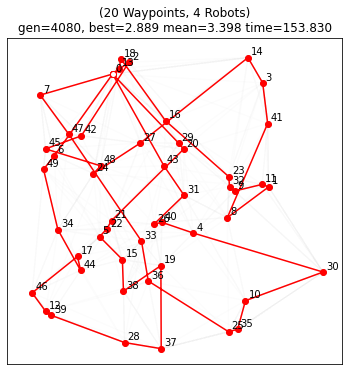

{'gen': 4120, 'best_index': 8, 'best_score': 2.8891575494538664, 'mean_score': 3.3830197858379654, 'mean_gap': 3.3830197858379654, 'time': 157.4505217075348}


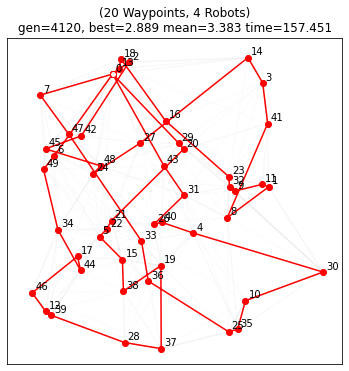

{'gen': 4160, 'best_index': 8, 'best_score': 2.8891575494538664, 'mean_score': 3.367737880343282, 'mean_gap': 3.367737880343282, 'time': 161.3418414592743}


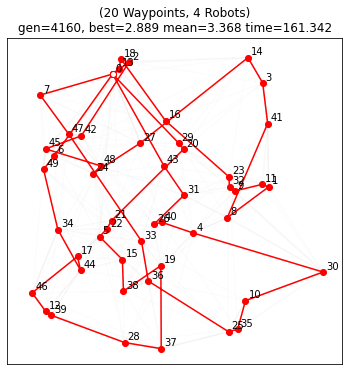

{'gen': 4200, 'best_index': 22, 'best_score': 2.8891575494538664, 'mean_score': 3.3516637615892777, 'mean_gap': 3.3516637615892777, 'time': 165.27117705345154}


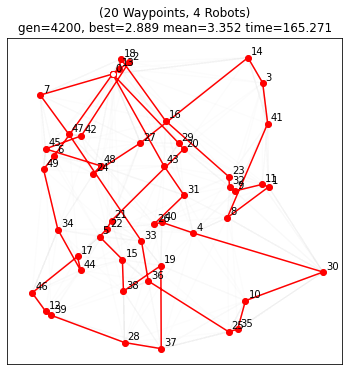

{'gen': 4240, 'best_index': 7, 'best_score': 2.85677006325926, 'mean_score': 3.330862802293885, 'mean_gap': 3.330862802293885, 'time': 168.87591743469238}


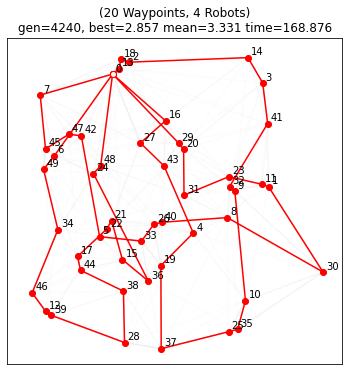

{'gen': 4280, 'best_index': 7, 'best_score': 2.852549327091802, 'mean_score': 3.3102872634315608, 'mean_gap': 3.3102872634315608, 'time': 171.88905715942383}


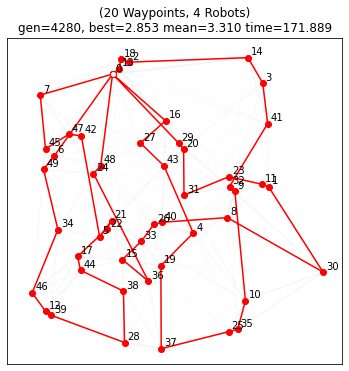

{'gen': 4320, 'best_index': 36, 'best_score': 2.849062450885423, 'mean_score': 3.295072957501239, 'mean_gap': 3.295072957501239, 'time': 174.27600717544556}


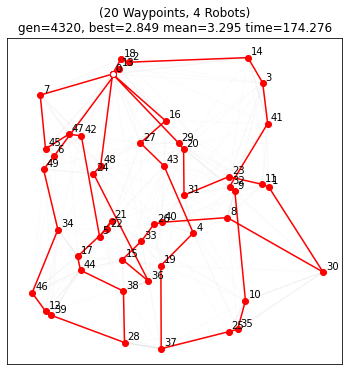

{'gen': 4360, 'best_index': 36, 'best_score': 2.8355657257388613, 'mean_score': 3.2717995747866566, 'mean_gap': 3.2717995747866566, 'time': 176.69151544570923}


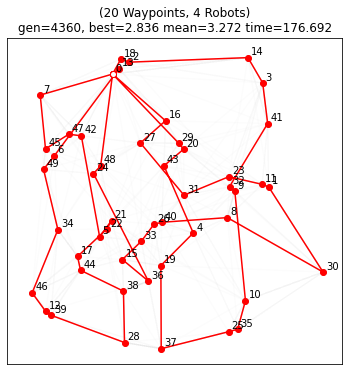

{'gen': 4400, 'best_index': 4, 'best_score': 2.827074388040738, 'mean_score': 3.2489753467634968, 'mean_gap': 3.2489753467634968, 'time': 179.37018156051636}


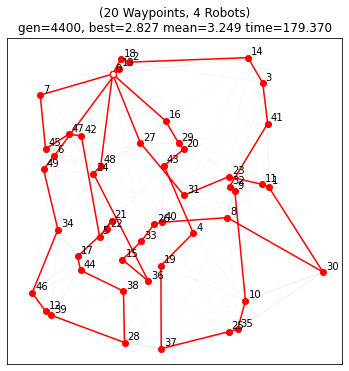

{'gen': 4440, 'best_index': 4, 'best_score': 2.8147168118337964, 'mean_score': 3.237300542449148, 'mean_gap': 3.237300542449148, 'time': 182.34889388084412}


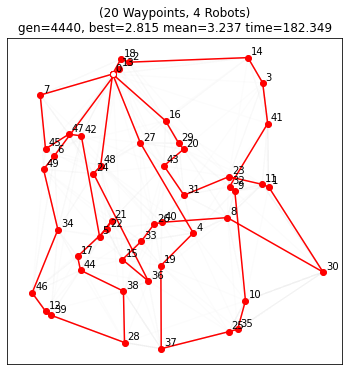

{'gen': 4480, 'best_index': 4, 'best_score': 2.814716811833796, 'mean_score': 3.219282183848469, 'mean_gap': 3.219282183848469, 'time': 185.03625178337097}


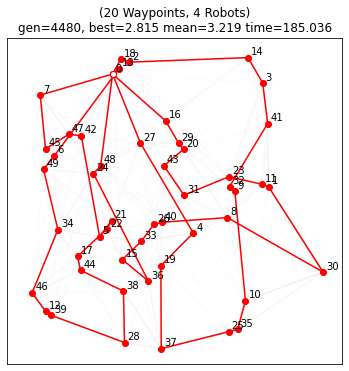

{'gen': 4520, 'best_index': 19, 'best_score': 2.8082815475572875, 'mean_score': 3.202917507196065, 'mean_gap': 3.202917507196065, 'time': 187.6727545261383}


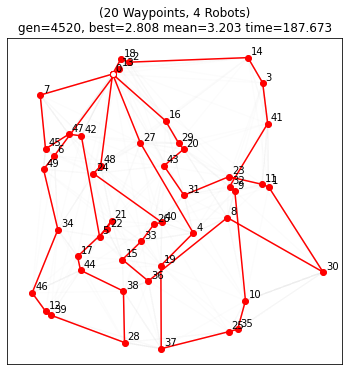

{'gen': 4560, 'best_index': 19, 'best_score': 2.8082815475572875, 'mean_score': 3.188453468954431, 'mean_gap': 3.188453468954431, 'time': 190.514981508255}


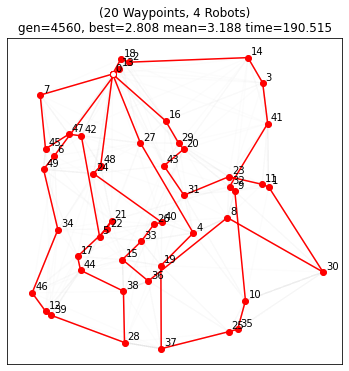

{'gen': 4600, 'best_index': 19, 'best_score': 2.8082815475572875, 'mean_score': 3.1714815897087076, 'mean_gap': 3.1714815897087076, 'time': 193.3525116443634}


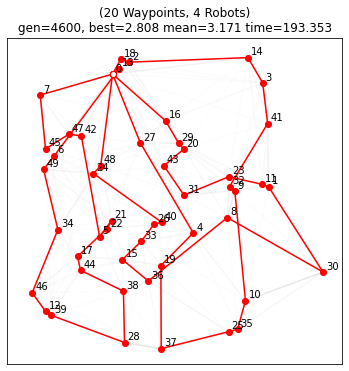

{'gen': 4640, 'best_index': 19, 'best_score': 2.8082815475572875, 'mean_score': 3.16020610235861, 'mean_gap': 3.16020610235861, 'time': 196.38967037200928}


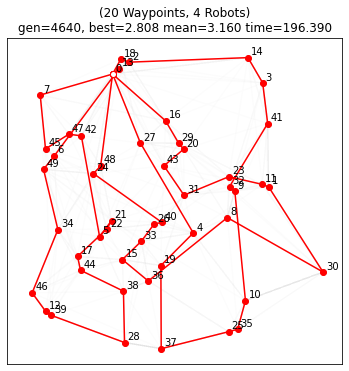

{'gen': 4680, 'best_index': 17, 'best_score': 2.8082815475572875, 'mean_score': 3.146131386426206, 'mean_gap': 3.146131386426206, 'time': 199.1995666027069}


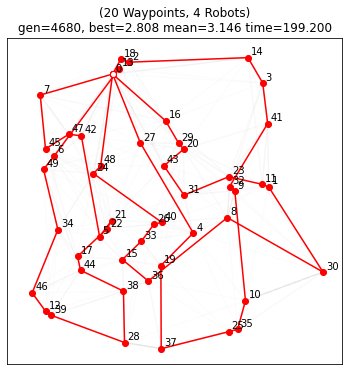

{'gen': 4720, 'best_index': 17, 'best_score': 2.8082815475572875, 'mean_score': 3.1281164463609406, 'mean_gap': 3.1281164463609406, 'time': 202.92015171051025}


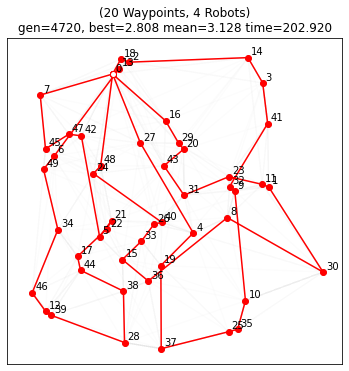

{'gen': 4760, 'best_index': 17, 'best_score': 2.8082815475572875, 'mean_score': 3.112581027322819, 'mean_gap': 3.112581027322819, 'time': 208.015474319458}


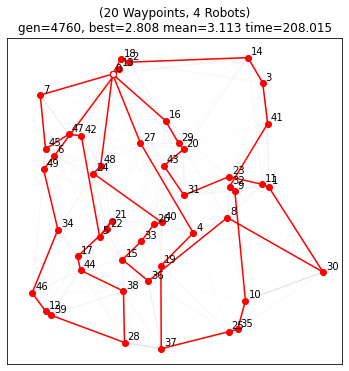

{'gen': 4800, 'best_index': 34, 'best_score': 2.8082815475572875, 'mean_score': 3.0991383300113187, 'mean_gap': 3.0991383300113187, 'time': 213.34587788581848}


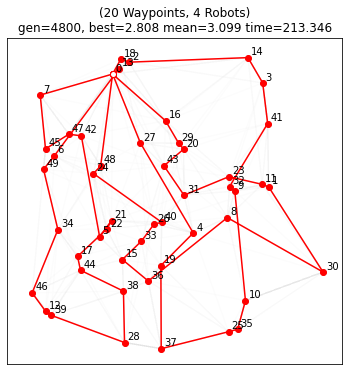

{'gen': 4840, 'best_index': 34, 'best_score': 2.804578640181959, 'mean_score': 3.086542398906783, 'mean_gap': 3.086542398906783, 'time': 216.87366461753845}


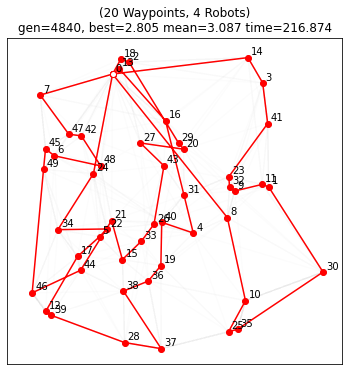

{'gen': 4880, 'best_index': 22, 'best_score': 2.7954823915522415, 'mean_score': 3.070609799194372, 'mean_gap': 3.070609799194372, 'time': 220.6795403957367}


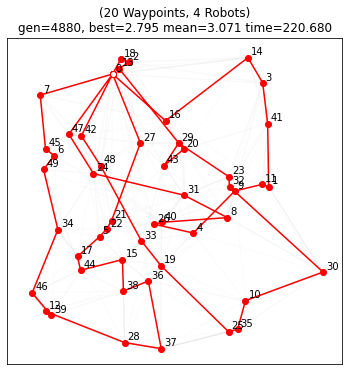

{'gen': 4920, 'best_index': 14, 'best_score': 2.789984351400505, 'mean_score': 3.064171933583303, 'mean_gap': 3.064171933583303, 'time': 224.62720680236816}


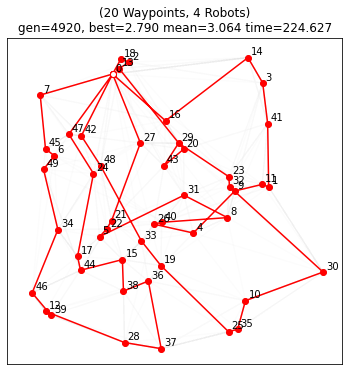

{'gen': 4960, 'best_index': 14, 'best_score': 2.7834962346008814, 'mean_score': 3.0586602429504395, 'mean_gap': 3.0586602429504395, 'time': 228.65252900123596}


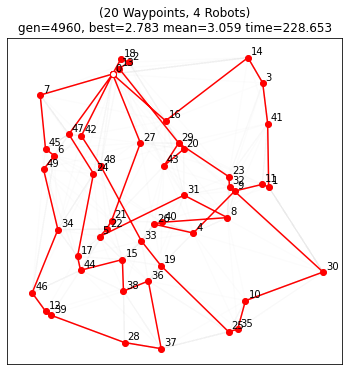

{'gen': 5000, 'best_index': 11, 'best_score': 2.76293227834201, 'mean_score': 3.052620513382961, 'mean_gap': 3.052620513382961, 'time': 233.23271703720093}


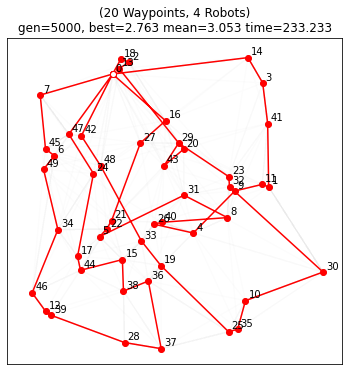

{'gen': 5040, 'best_index': 37, 'best_score': 2.7487417163913697, 'mean_score': 3.0491107955240273, 'mean_gap': 3.0491107955240273, 'time': 238.03025269508362}


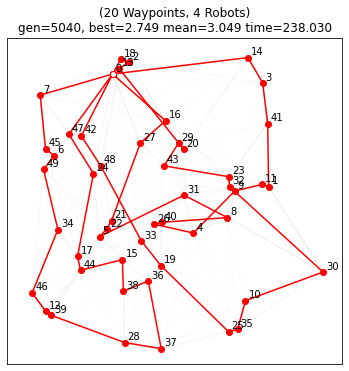

{'gen': 5080, 'best_index': 26, 'best_score': 2.7487417163913688, 'mean_score': 3.04094239807318, 'mean_gap': 3.04094239807318, 'time': 242.29398274421692}


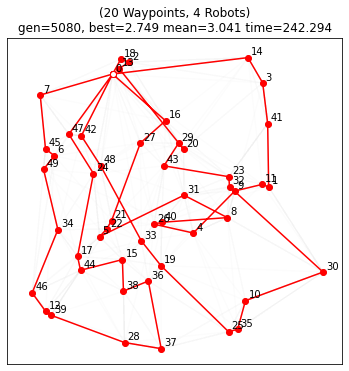

{'gen': 5120, 'best_index': 20, 'best_score': 2.7484035439166346, 'mean_score': 3.034665832667855, 'mean_gap': 3.034665832667855, 'time': 247.1907331943512}


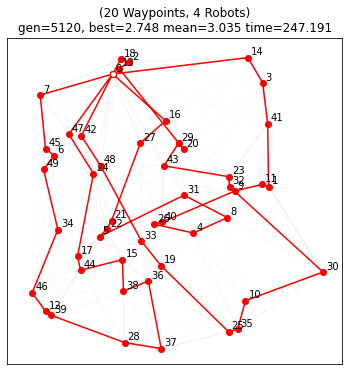

{'gen': 5160, 'best_index': 20, 'best_score': 2.7484035439166346, 'mean_score': 3.030590140980725, 'mean_gap': 3.030590140980725, 'time': 252.11120104789734}


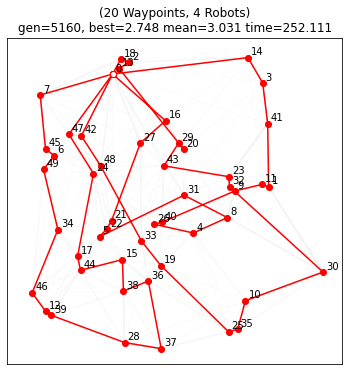

{'gen': 5200, 'best_index': 20, 'best_score': 2.7484035439166346, 'mean_score': 3.0264209220438354, 'mean_gap': 3.0264209220438354, 'time': 257.2038080692291}


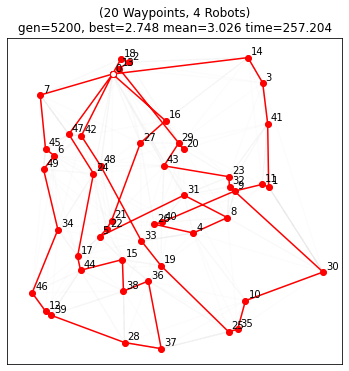

{'gen': 5240, 'best_index': 20, 'best_score': 2.7484035439166346, 'mean_score': 3.023548154733143, 'mean_gap': 3.023548154733143, 'time': 262.00129532814026}


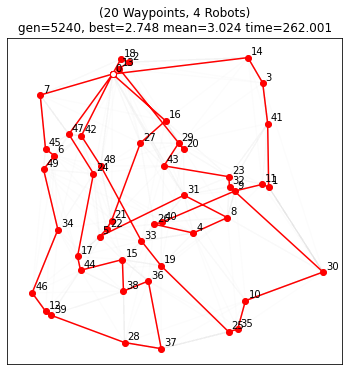

{'gen': 5280, 'best_index': 20, 'best_score': 2.7484035439166346, 'mean_score': 3.020700932737173, 'mean_gap': 3.020700932737173, 'time': 266.6813666820526}


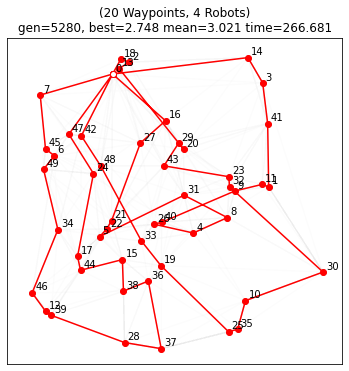

{'gen': 5320, 'best_index': 38, 'best_score': 2.7392595458451634, 'mean_score': 3.015901713205807, 'mean_gap': 3.015901713205807, 'time': 271.4129276275635}


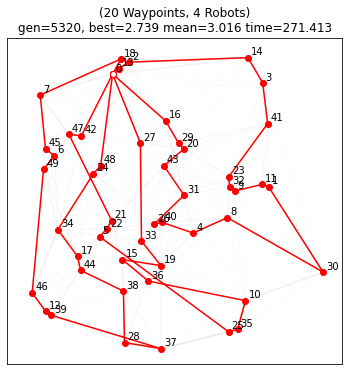

{'gen': 5360, 'best_index': 2, 'best_score': 2.7361155692498906, 'mean_score': 3.013971034111311, 'mean_gap': 3.013971034111311, 'time': 276.01795268058777}


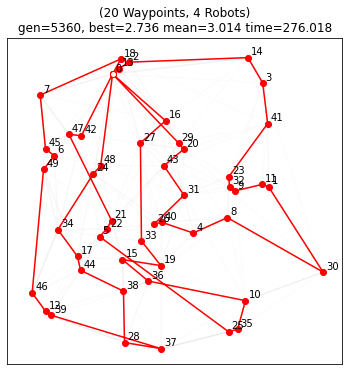

{'gen': 5400, 'best_index': 22, 'best_score': 2.7359797750538313, 'mean_score': 3.010712133219626, 'mean_gap': 3.010712133219626, 'time': 280.55477356910706}


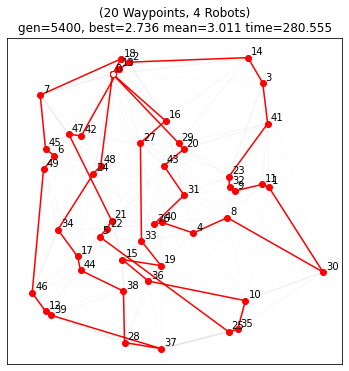

{'gen': 5440, 'best_index': 20, 'best_score': 2.7359797750538313, 'mean_score': 3.0072979906981994, 'mean_gap': 3.0072979906981994, 'time': 285.1514947414398}


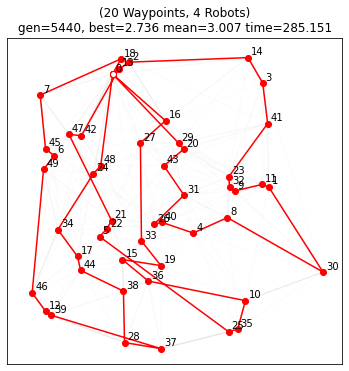

{'gen': 5480, 'best_index': 20, 'best_score': 2.7359797750538313, 'mean_score': 3.0056036727177426, 'mean_gap': 3.0056036727177426, 'time': 290.07118678092957}


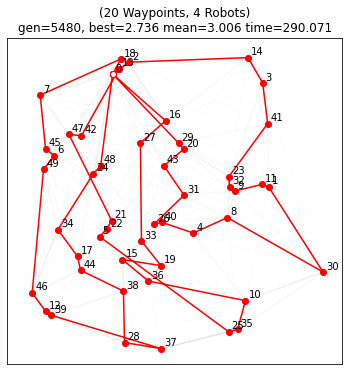

{'gen': 5520, 'best_index': 29, 'best_score': 2.7310372698592533, 'mean_score': 3.000307785098159, 'mean_gap': 3.000307785098159, 'time': 295.0742259025574}


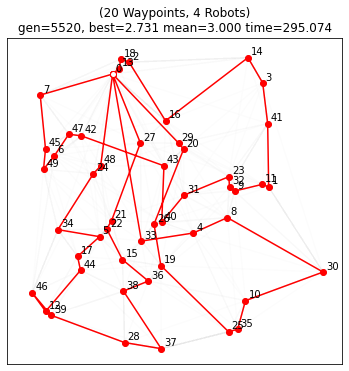

{'gen': 5560, 'best_index': 27, 'best_score': 2.731037269859253, 'mean_score': 2.9970899392700145, 'mean_gap': 2.9970899392700145, 'time': 300.15372943878174}


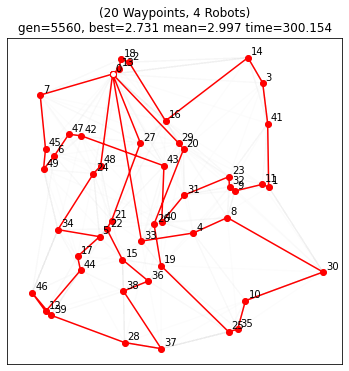

{'gen': 5600, 'best_index': 31, 'best_score': 2.7272536598919324, 'mean_score': 2.9959858406757616, 'mean_gap': 2.9959858406757616, 'time': 305.2430329322815}


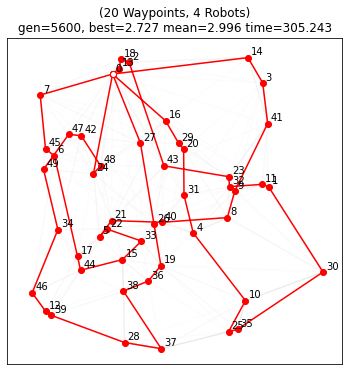

{'gen': 5640, 'best_index': 31, 'best_score': 2.7098786823424734, 'mean_score': 2.993301956932002, 'mean_gap': 2.993301956932002, 'time': 310.12246966362}


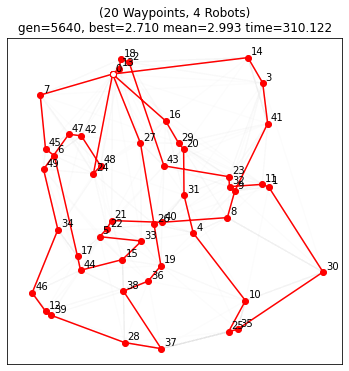

{'gen': 5680, 'best_index': 31, 'best_score': 2.66068525233482, 'mean_score': 2.990149583653631, 'mean_gap': 2.990149583653631, 'time': 315.86720991134644}


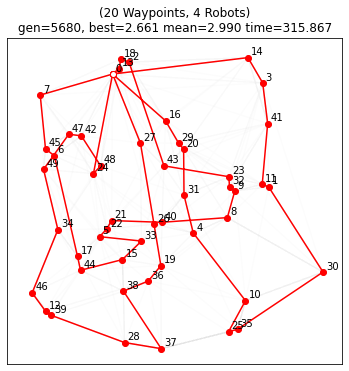

{'gen': 5720, 'best_index': 31, 'best_score': 2.66068525233482, 'mean_score': 2.9890204142725105, 'mean_gap': 2.9890204142725105, 'time': 322.22412061691284}


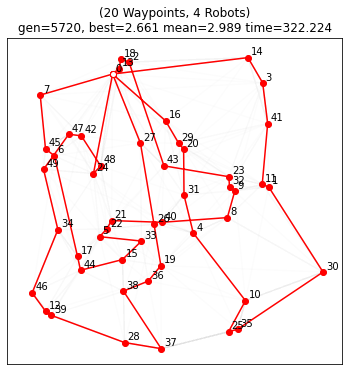

{'gen': 5760, 'best_index': 31, 'best_score': 2.66068525233482, 'mean_score': 2.988467865448701, 'mean_gap': 2.988467865448701, 'time': 327.33147978782654}


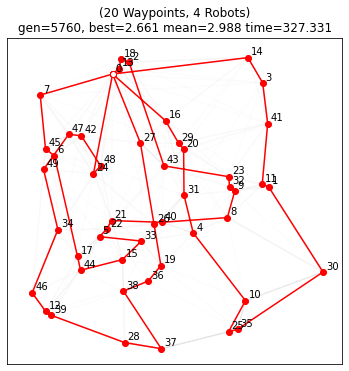

{'gen': 5800, 'best_index': 31, 'best_score': 2.66068525233482, 'mean_score': 2.988322794690562, 'mean_gap': 2.988322794690562, 'time': 333.33249282836914}


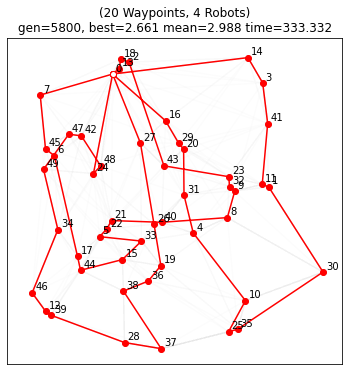

{'gen': 5840, 'best_index': 31, 'best_score': 2.66068525233482, 'mean_score': 2.987791465432192, 'mean_gap': 2.987791465432192, 'time': 338.4169125556946}


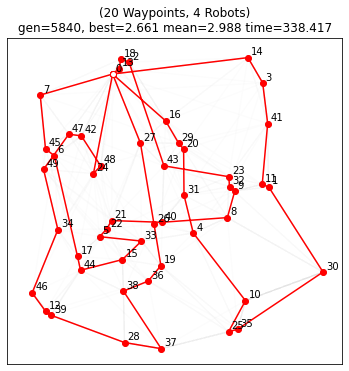

{'gen': 5880, 'best_index': 38, 'best_score': 2.66068525233482, 'mean_score': 2.9859413189519755, 'mean_gap': 2.9859413189519755, 'time': 343.7357437610626}


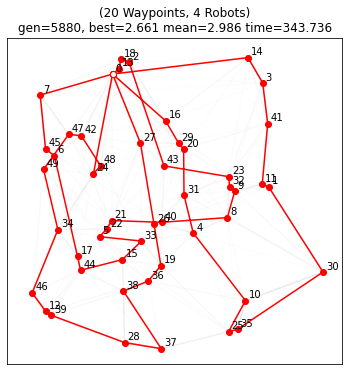

{'gen': 5920, 'best_index': 26, 'best_score': 2.66068525233482, 'mean_score': 2.9855721734688294, 'mean_gap': 2.9855721734688294, 'time': 349.9924645423889}


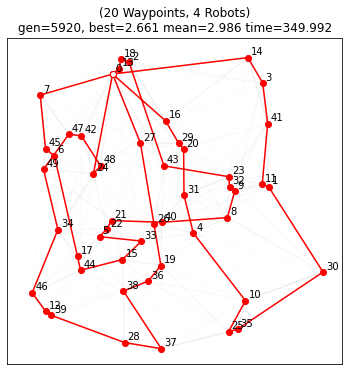

{'gen': 5960, 'best_index': 26, 'best_score': 2.66068525233482, 'mean_score': 2.9845027732153673, 'mean_gap': 2.9845027732153673, 'time': 356.2768247127533}


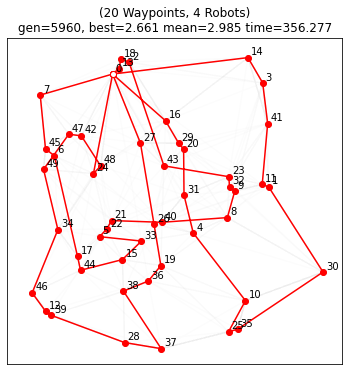

{'gen': 6000, 'best_index': 35, 'best_score': 2.66068525233482, 'mean_score': 2.98372263864533, 'mean_gap': 2.98372263864533, 'time': 361.7367491722107}


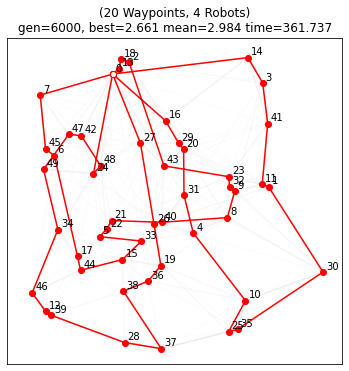

{'gen': 6040, 'best_index': 31, 'best_score': 2.66068525233482, 'mean_score': 2.9833946956000057, 'mean_gap': 2.9833946956000057, 'time': 367.24562406539917}


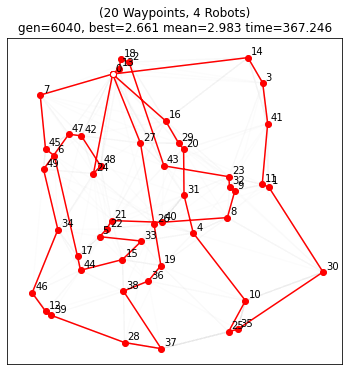

{'gen': 6080, 'best_index': 31, 'best_score': 2.66068525233482, 'mean_score': 2.9826490433089345, 'mean_gap': 2.9826490433089345, 'time': 372.3279917240143}


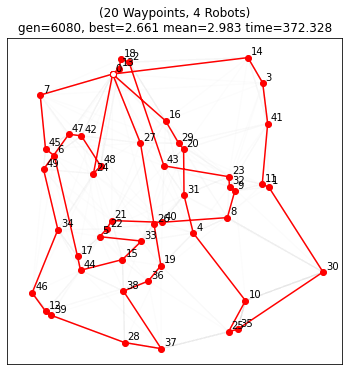

{'gen': 6120, 'best_index': 7, 'best_score': 2.66068525233482, 'mean_score': 2.9824238691573997, 'mean_gap': 2.9824238691573997, 'time': 377.78384351730347}


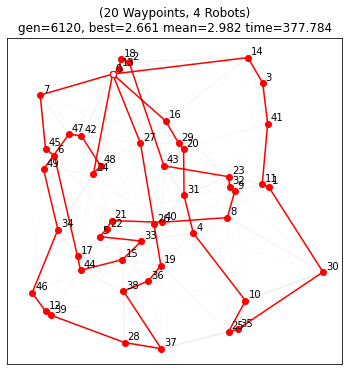

{'gen': 6160, 'best_index': 33, 'best_score': 2.66068525233482, 'mean_score': 2.9816231352958917, 'mean_gap': 2.9816231352958917, 'time': 384.19956040382385}


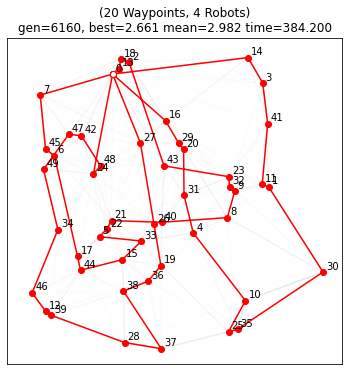

{'gen': 6200, 'best_index': 33, 'best_score': 2.66068525233482, 'mean_score': 2.9816099537467955, 'mean_gap': 2.9816099537467955, 'time': 390.71302103996277}


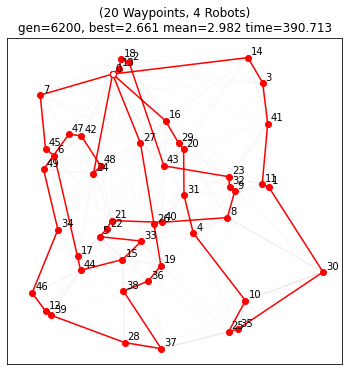

{'gen': 6240, 'best_index': 26, 'best_score': 2.66068525233482, 'mean_score': 2.9815875755864596, 'mean_gap': 2.9815875755864596, 'time': 398.22438287734985}


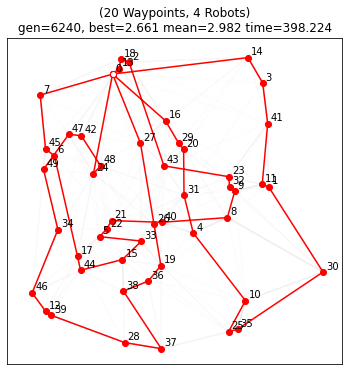

{'gen': 6280, 'best_index': 17, 'best_score': 2.66068525233482, 'mean_score': 2.9808403776801327, 'mean_gap': 2.9808403776801327, 'time': 404.5975875854492}


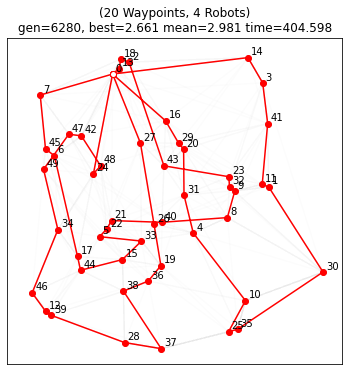

{'gen': 6320, 'best_index': 17, 'best_score': 2.66068525233482, 'mean_score': 2.9805872707349144, 'mean_gap': 2.9805872707349144, 'time': 410.0178337097168}


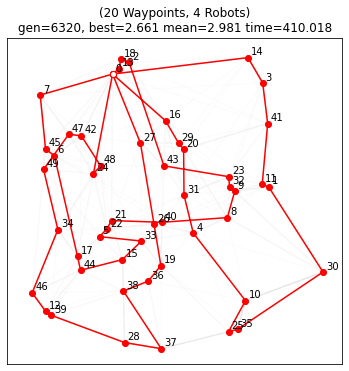

{'gen': 6360, 'best_index': 7, 'best_score': 2.66068525233482, 'mean_score': 2.9804620957564305, 'mean_gap': 2.9804620957564305, 'time': 415.53691148757935}


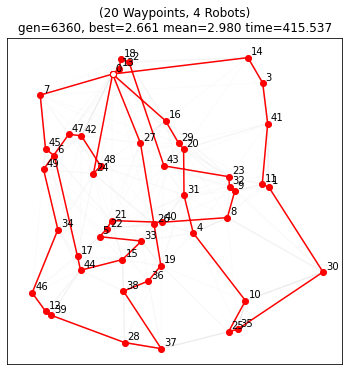

{'gen': 6400, 'best_index': 7, 'best_score': 2.66068525233482, 'mean_score': 2.980462095756431, 'mean_gap': 2.980462095756431, 'time': 420.822829246521}


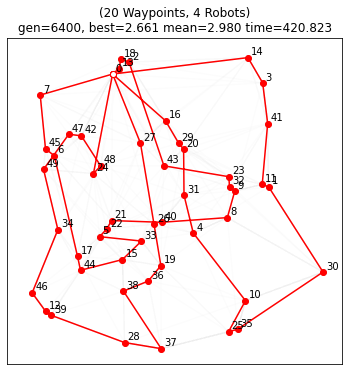

_______________________________________ result _______________________________________
para = np.array([16, 29, 20, 31, 4, 10, 25, 35, 30, 1, 11, 41, 3, 14, 0, 27, 26, 19, 36, 38, 37, 28, 39, 12, 46, 34, 49, 47, 42, 48, 24, 0, 13, 18, 2, 43, 23, 32, 9, 8, 40, 21, 22, 5, 33, 15, 44, 17, 6, 45, 7])
score = 2.66068525233482
________________________________________ end _________________________________________
[16 29 20 31  4 10 25 35 30  1 11 41  3 14  0 27 26 19 36 38 37 28 39 12
 46 34 49 47 42 48 24  0 13 18  2 43 23 32  9  8 40 21 22  5 33 15 44 17
  6 45  7]
2.66068525233482
CPU times: total: 6min 51s
Wall time: 7min 1s


In [12]:
%%time

np.random.shuffle(path)
print(path) 
walltime = time.time()
cputime = time.process_time()

history_vcopt = []

best_path, score = vcopt().tspGA(path,                            # input our initial guess at a path
                            score_func,                            # input our custom cost function
                            0.0,                            # we want to minimise our score which measures total distance
                            show_pool_func=tsp_show_pool,                            # input our custom plotting function
                            pool_num=NO_POOL,                            # number of paths in each generation's population
                            seed=69,                                # seed for reproducible results
                            ) 
vcopt_walltime = time.time()-walltime
vcopt_cputime = time.process_time()-cputime

print(best_path)
print(score)